<a href="https://colab.research.google.com/github/bsugerman/dip/blob/master/difimphot_dev.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://itk.org/Doxygen/html/ImageSimilarityMetricsPage.html, in particular look at normalized correlation and maybe pattern intensity. 




In [0]:
!pip install sewar

In [0]:
import os
from google.colab import drive
drive.mount('/gdrive')
os.symlink('/gdrive/My Drive', '/content/gdrive')
!ls -l /content/gdrive/dip | head

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /gdrive
total 80889
-rw------- 1 root root 24248542 Jan 21 03:50 dif2.pkl
-rw------- 1 root root 18467296 Jan 27 12:14 dif3.pkl
-rw------- 1 root root 40113563 Jan 23 03:13 dif.pkl


In [0]:
import numpy as np
import matplotlib.pyplot as plt
#from astropy.io import fits
import keras 
from keras.models import Model,Sequential
from keras import layers as L
from keras import callbacks as C
from keras import backend as K
import pickle
from skimage.measure import compare_ssim as ssim
import scipy.ndimage as snd
from tensorflow import boolean_mask
from tensorflow.image import ssim_multiscale
from datetime import datetime
from skimage import morphology as skm


Using TensorFlow backend.


In [0]:
# keras layer where the image is to be fit.
class kernel_image(keras.initializers.Initializer):
    def __init__(self,image):
        self.image=image[...,np.newaxis] #np.ravel(image[...,np.newaxis])[...,np.newaxis,np.newaxis]
    def __call__(self,shape,dtype=None):
        return self.image
    
class kernel_psf(keras.initializers.Initializer):
    def __init__(self,psf):
        self.psf=psf #image[...,np.newaxis] 
    def __call__(self,shape,dtype=None):
        return self.image
    

class Image2D(Layer):
    def __init__(self,init_image,**kwargs):
        if 'name' not in kwargs:
            kwargs['name']='Image2D'
        self.init_image=init_image
        super(Image2D, self).__init__(**kwargs)
        
    def build(self,input_shape):
        # Create a trainable weight variable for this layer.
        assert len(input_shape)>=2
        self.kernel = self.add_weight(name='kernel', 
                                      shape=self.init_image.shape,
                                      initializer=kernel_image(self.init_image),
                                      trainable=True)
        super(Image2D, self).build(input_shape)  # Be sure to call this at the end

    def call(self, x):
        return x + self.kernel 

    def compute_output_shape(self, input_shape):
        return input_shape

# sample to convolve image
img_shape=(21,32)
input_shape=(1,)+img_shape
init_image=np.arange(np.prod(img_shape)).reshape(img_shape).astype(np.float32)
output_image=input_image*2 # just to see if scale factor comes out right
z0 = L.Input(shape=input_shape)
x=Image2D()(z0)
x=L.Conv2D(filters=3,kernel_size=1,padding='same',use_bias=False,data_format='channels_first')(x)
model= keras.models.Model(inputs=[z0], outputs=x)
opt=keras.optimizers.Adam(lr=0.1,decay=0.01)
model.compile(loss='mae', optimizer=opt)
history=model.fit([init_image[np.newaxis,np.newaxis,...]],[[output_image]],
                  epochs=100,batch_size=1)

In [0]:
# fits specific functions
def imload(fits_file,return_headers=False):
    hdul = fits.open(fits_file)
    image = hdul[0].data
    if return_headers:
        return image,hdul[0].header
    else:
        return image

from skimage import morphology

def clean_mask(mask,biggest_hole=25,biggest_sep=2,smooth_radius=2):
    tmp=skm.remove_small_holes(mask,biggest_hole,biggest_sep)
    tmp=skm.binary_erosion(tmp,skm.disk(smooth_radius))
    return skm.remove_small_objects(tmp,biggest_hole,biggest_sep)
  
def edgemask(image,edge=0,min=None,max=None,
             biggest_hole=25,biggest_sep=2,smooth_radius=2):
    x=np.squeeze(image)
    markers=np.ones_like(x)+1
    markers[x==edge]=1 # mask out constant bdy value
    segmentation=morphology.watershed(x,markers)
    #return segmentation
    mask=(segmentation-1).astype(bool) # mask is 0==bad, 1==good
    #apply opening to get rid of the streaks
    mask=skm.binary_opening(mask,skm.disk(6))

    markers=np.ones_like(x).astype(bool)
    if max is not None:
        markers[x>max]=False # mask out high values
    if min is not None:
        markers[x<min]=False # mask out high values
    mask *= markers
    return clean_mask(mask,biggest_hole,biggest_sep,smooth_radius)


def maskmult(inp_mask,ref_mask,biggest_hole=25,biggest_sep=2,smooth_radius=2):
    return clean_mask(inp_mask*ref_mask,biggest_hole,biggest_sep,smooth_radius)

def odd(x):
    y=int(x)
    if np.mod(y,2):
       return y
    return y+1
  
def Gaussian(x,sigma):
    return np.exp(-x**2/sigma**2)

def kcube(shape,dtype="float32"):
    '''
    kernel initializer that looks somewhat like a psf-matching kernel
    '''
    px=shape[0]
    d=int((px-1.)/2.)
    x, y = np.meshgrid(np.linspace(-d,d,px), np.linspace(-d,d,px))
    r = np.sqrt(x*x+y*y)
    base=0.1*np.cos(2*np.pi*r/2.)*np.exp(-2.*r/d) #cong(r,2.,5)
    base+=0.6*Gaussian(r,1.4)
    #plt.imshow(base); plt.show()
    return K.variable(base[...,np.newaxis,np.newaxis],dtype=dtype)  
  
#def ssim(y_true, y_pred):
#    return mse(y_true, y_pred) + alpha * gse(y_true, y_pred)


class keras_masked_mae:
  from tensorflow import boolean_mask
  def __init__(self,mask,expand=3):
    self.__name__='kmmae'
    # grow the mask edges by a few pix to ignore edge effects
    m=skm.binary_erosion(mask,skm.disk(expand))
    self.mask=K.variable(m[np.newaxis,...],dtype="bool")

  def __call__(self, y_true, y_pred):
    masked_pred=boolean_mask(y_pred,self.mask)
    masked_true=boolean_mask(y_true,self.mask)
    #print(K.eval(K.sum(masked_pred)))

    return K.mean(K.abs(masked_pred-masked_true))
  
class keras_masked_mape:
  from tensorflow import boolean_mask
  def __init__(self,mask,expand=3):
    self.__name__='kmmape'
    # grow the mask edges by a few pix to ignore edge effects
    m=skm.binary_erosion(mask,skm.disk(expand))
    self.mask=K.variable(m[np.newaxis,...],dtype="bool")

  def __call__(self, y_true, y_pred):
    masked_pred=boolean_mask(y_pred,self.mask)
    masked_true=boolean_mask(y_true,self.mask)
    #print(K.eval(K.sum(masked_pred)))

    return 100.*K.mean(K.abs(masked_pred-masked_true)/(masked_true+K.epsilon()))
  
class keras_masked_msssim:
  '''
  There is literature () and my own experimentation to show that
  the combination of MSSSIM and L1 (MAE) does the best fit. It is slow
  however and it would be nice to find ways to speed this up for 
  production use. Perhaps use just MAE to find a rough first guess and 
  then turn on both to finish?
  '''
  from tensorflow import boolean_mask
  from tensorflow.image import ssim_multiscale
  def __init__(self,mask,expand=3,l1=1.):
    self.__name__='kmsssim'
    # grow the mask edges by a few pix to ignore edge effects
    m=skm.binary_erosion(mask,skm.disk(expand))
    self.mask4=K.variable(m[np.newaxis,...,np.newaxis],dtype="float32")
    self.mask3=K.variable(m[np.newaxis,...],dtype='bool')

    self.l1=l1

  def __call__(self, y_true, y_pred):
    masked_pred=y_pred*self.mask4
    masked_true=y_true*self.mask4
    masked_msssim=1.-(ssim_multiscale(masked_pred,masked_true,K.max(masked_true)))
    
    masked_pred=boolean_mask(y_pred,self.mask3)
    masked_true=boolean_mask(y_true,self.mask3)
    masked_l1=K.mean(K.abs(masked_pred-masked_true)) # MAE
    return masked_msssim + self.l1*masked_l1

class keras_msssim:
  '''
  There is literature () and my own experimentation to show that
  the combination of MSSSIM and L1 (MAE) does the best fit. It is slow
  however and it would be nice to find ways to speed this up for 
  production use. Perhaps use just MAE to find a rough first guess and 
  then turn on both to finish?
  '''
  from tensorflow import boolean_mask
  from tensorflow.image import ssim_multiscale
  def __init__(self,l1=1.):
    self.__name__='kmsssim'
    self.l1=l1

  def __call__(self, y_true, y_pred):
    msssim=1.-(ssim_multiscale(y_pred,y_true,K.max(y_true)))
    l1=K.mean(K.abs(y_pred-y_true)) # MAE
    return msssim + self.l1*l1

class msssim_l1():
    '''
    There is literature () and my own experimentation to show that
    the combination of MSSSIM and L1 (MAE) does the best fit. It is slow
    however and it would be nice to find ways to speed this up for 
    production use. Perhaps use just MAE to find a rough first guess and 
    then turn on both to finish?
    '''
    def __init__(self,image,l1=1.):
        _MSSSIM_WEIGHTS = (0.0448, 0.2856, 0.3001, 0.2363, 0.1333)
        self.__name__='msssim_l1'
        min_dim=np.min(image.shape[:2])
        m=1+np.min((4,int(np.floor(np.log(min_dim/11.)/np.log(2.)))))
        assert (m>0),"Low-Res Image must have dimensions greater than 11 pix on a side"
        self.weights=_MSSSIM_WEIGHTS[:m]/np.sum(_MSSSIM_WEIGHTS[:m])
        self.l1=l1

    def __call__(self, y_true, y_pred):
        msssim=(1.-(ssim_multiscale(y_pred,y_true,K.max(y_true)-K.min(y_true),
                                   power_factors=self.weights)))
        l1=self.l1*K.mean(K.abs(y_pred-y_true))  #K.sum(msssim)
        return l1+msssim
    
class msssim_logcosh():
    '''
    Custom loss function combining the MS-SSIM and logcosh between two images. 
    
    Input:
      image (array/tensor): Upon init, feed in the y_true image stack/tensor so the msssim 
        can figure out the right combination of weights to use
      alpha (float): How much of logcosh() to add to mssssim()
      
    There is literature () and my own experimentation to show that
    the combination of MSSSIM and L1 (MAE) does the best fit. I think
    logcosh may work a little better because the derivatives are more straightforward
    and large excursions don't carry quite as much weight. 
    '''
    def __init__(self,image,alpha=1.):
        _MSSSIM_WEIGHTS = (0.0448, 0.2856, 0.3001, 0.2363, 0.1333)
        self.__name__='msssim_logcosh'
        min_dim=np.min(image.shape[:2])
        m=1+np.min((4,int(np.floor(np.log(min_dim/11.)/np.log(2.)))))
        assert (m>0),"Low-Res Image must have dimensions greater than 11 pix on a side"
        self.weights=_MSSSIM_WEIGHTS[:m]/np.sum(_MSSSIM_WEIGHTS[:m])
        self.alpha=alpha

    def __call__(self, y_true, y_pred):
        msssim=(1.-(ssim_multiscale(y_pred,y_true,K.max(y_true)-K.min(y_true),
                                   power_factors=self.weights)))
        l=self.alpha*keras.losses.logcosh(y_true,y_pred)
        return l+msssim
    
 

from keras.callbacks import Callback
class SGDRScheduler(Callback):
    '''Cosine annealing learning rate scheduler with periodic restarts.
    # Usage
        ```python
            schedule = SGDRScheduler(min_lr=1e-5,
                                     max_lr=1e-2,
                                     steps_per_epoch=np.ceil(epoch_size/batch_size),
                                     lr_decay=0.9,
                                     cycle_length=5,
                                     mult_factor=1.5)
            model.fit(X_train, Y_train, epochs=100, callbacks=[schedule])
        ```
    # Arguments
        min_lr: The lower bound of the learning rate range for the experiment.
        max_lr: The upper bound of the learning rate range for the experiment.
        steps_per_epoch: Number of mini-batches in the dataset. Calculated as `np.ceil(epoch_size/batch_size)`. 
        lr_decay: Reduce the max_lr after the completion of each cycle.
                  Ex. To reduce the max_lr by 20% after each cycle, set this value to 0.8.
        cycle_length: Initial number of epochs in a cycle.
        mult_factor: Scale epochs_to_restart after each full cycle completion.
    # References
        Blog post: jeremyjordan.me/nn-learning-rate
        Original paper: http://arxiv.org/abs/1608.03983

    Edited by BKS to only updat LR after each epoch, not batch
    '''
    def __init__(self,
                 steps_per_epoch,
                 verbose=False,
                 min_lr=1.e-2,
                 max_lr=1.e-5,
                 lr_decay=1,
                 cycle_length=10,
                 max_steps=np.inf,
                 mult_factor=1.5):

        self.verbose=verbose
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.lr_decay = lr_decay

        self.batch_since_restart = 0
        self.next_restart = cycle_length

        self.steps_per_epoch = 1. # steps_per_epoch (BKS)

        self.cycle_length = cycle_length
        self.max_steps = max_steps
        self.mult_factor = mult_factor

        self.history = {}

    def clr(self):
        '''Calculate the learning rate.'''
        fraction_to_restart = self.batch_since_restart / (self.steps_per_epoch * self.cycle_length)
        lr = self.min_lr + 0.5 * (self.max_lr - self.min_lr) * (1 + np.cos(fraction_to_restart * np.pi))
        return lr

    def on_train_begin(self, logs={}):
        '''Initialize the learning rate to the minimum value at the start of training.'''
        logs = logs or {}
        K.set_value(self.model.optimizer.lr, self.max_lr)

    def on_batch_end(self, batch, logs={}):
        '''Record previous batch statistics and update the learning rate.'''
        return # BKS
        logs = logs or {}
        self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)

        self.batch_since_restart += 1
        K.set_value(self.model.optimizer.lr, self.clr())

    def on_epoch_end(self, epoch, logs={}):
        '''Check for end of current cycle, apply restarts when necessary.'''
        
        self.batch_since_restart += 1
      
        if epoch == self.next_restart:
            self.batch_since_restart = 0
            self.cycle_length = np.ceil(self.cycle_length * self.mult_factor)
            self.cycle_length = np.min((self.cycle_length,self.max_steps))
            self.next_restart += self.cycle_length
            self.max_lr *= self.lr_decay
            self.best_weights = self.model.get_weights()
        K.set_value(self.model.optimizer.lr, self.clr())
        if self.verbose:
            print ("new lr: {:.4g}".format(K.get_value(self.model.optimizer.lr)))

    def on_train_end(self, logs={}):
        '''Set weights to the values from the end of the most recent cycle for best performance.'''
        self.model.set_weights(self.best_weights)

#
class ELRScheduler(Callback):
    '''exponential annealing learning rate scheduler with periodic restarts.
    # Usage
        ```python
            schedule = ELRScheduler(min_lr=1e-5,
                                     max_lr=1e-2,
                                     steps_per_epoch=np.ceil(epoch_size/batch_size),
                                     lr_decay=0.9,
                                     cycle_length=5,
                                     mult_factor=1.5)
            model.fit(X_train, Y_train, epochs=100, callbacks=[schedule])
        ```
    # Arguments
        min_lr: The lower bound of the learning rate range for the experiment.
        max_lr: The upper bound of the learning rate range for the experiment.
        steps_per_epoch: Number of mini-batches in the dataset. Calculated as `np.ceil(epoch_size/batch_size)`. 
        lr_decay: Reduce the max_lr after the completion of each cycle.
                  Ex. To reduce the max_lr by 20% after each cycle, set this value to 0.8.
        cycle_length: Initial number of epochs in a cycle.
        mult_factor: Scale epochs_to_restart after each full cycle completion.
    # References
        Blog post: jeremyjordan.me/nn-learning-rate
        Original paper: http://arxiv.org/abs/1608.03983

    Edited by BKS to only update LR after each epoch, not batch
    '''
    def __init__(self,
                 steps_per_epoch,
                 verbose=False,
                 min_lr=1.e-2,
                 max_lr=1.e-5,
                 lr_decay=1,
                 cycle_length=10,
                 max_steps=np.inf,
                 mult_factor=1.5):

        self.verbose=verbose
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.lr_decay = lr_decay

        self.batch_since_restart = 0
        self.next_restart = cycle_length

        self.steps_per_epoch = 1. # steps_per_epoch (BKS)

        self.cycle_length = cycle_length
        self.max_steps = max_steps
        self.mult_factor = mult_factor

        self.history = {}

    def clr(self):
        '''Calculate the learning rate.'''
        fraction_to_restart = ((self.batch_since_restart-1.) / 
            (self.steps_per_epoch * (self.cycle_length-1.)))
        lr = self.max_lr * (self.min_lr/self.max_lr)**fraction_to_restart
        #lr = self.min_lr + 0.5 * (self.max_lr - self.min_lr) * (1 + np.cos(fraction_to_restart * np.pi))
        return lr

    def on_train_begin(self, logs={}):
        '''Initialize the learning rate to the minimum value at the start of training.'''
        logs = logs or {}
        K.set_value(self.model.optimizer.lr, self.max_lr)

    def on_batch_end(self, batch, logs={}):
        '''Record previous batch statistics and update the learning rate.'''
        return # BKS
        logs = logs or {}
        self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)

        self.batch_since_restart += 1
        K.set_value(self.model.optimizer.lr, self.clr())

    def on_epoch_end(self, epoch, logs={}):
        '''Check for end of current cycle, apply restarts when necessary.'''
        
        self.batch_since_restart += 1
      
        if epoch == self.next_restart:
            self.batch_since_restart = 1
            self.cycle_length = np.ceil(self.cycle_length * self.mult_factor)
            self.cycle_length = np.min((self.cycle_length,self.max_steps))
            self.next_restart += self.cycle_length
            self.max_lr *= self.lr_decay
            self.min_lr *= np.sqrt(self.lr_decay)
            self.best_weights = self.model.get_weights()
        K.set_value(self.model.optimizer.lr, self.clr())
        if self.verbose:
            print ("cycle step: {:.0f}, new lr: {:.4g}".format(
                self.batch_since_restart,K.get_value(self.model.optimizer.lr)))

    def on_train_end(self, logs={}):
        '''Set weights to the values from the end of the most recent cycle for best performance.'''
        self.model.set_weights(self.best_weights)




def masked_mae(y_true,y_pred,mask):
  tmp=np.squeeze(np.abs(y_true-y_pred))
  return np.mean(tmp[mask])
def masked_mape(y_true,y_pred,mask):
  tmp=np.squeeze(np.abs((y_true-y_pred)/(y_true+1.e-10)))
  return 100.*np.mean(tmp[mask])
def masked_mse(y_true,y_pred,mask):
  tmp=np.squeeze(np.square(y_true-y_pred))
  return np.mean(tmp[mask])

  

In [0]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import numpy as np

from tensorflow.python.compat import compat
from tensorflow.python.framework import constant_op
from tensorflow.python.framework import dtypes
from tensorflow.python.framework import ops
from tensorflow.python.framework import random_seed
from tensorflow.python.framework import tensor_shape
from tensorflow.python.framework import tensor_util
from tensorflow.python.ops import array_ops
from tensorflow.python.ops import check_ops
from tensorflow.python.ops import control_flow_ops
from tensorflow.python.ops import gen_image_ops
from tensorflow.python.ops import gen_nn_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.ops import nn
from tensorflow.python.ops import nn_ops
from tensorflow.python.ops import random_ops
from tensorflow.python.ops import string_ops
from tensorflow.python.ops import variables
from tensorflow.python.util import deprecation
from tensorflow.python.util.tf_export import tf_export
from tensorflow.python.ops import image_ops_impl as o

def _ssim_per_channel(img1, img2, max_val=1.0):
  filter_size = constant_op.constant(11, dtype=dtypes.int32)
  filter_sigma = constant_op.constant(1.5, dtype=img1.dtype)

  shape1, shape2 = array_ops.shape_n([img1, img2])
  checks = [
      control_flow_ops.Assert(math_ops.reduce_all(math_ops.greater_equal(
          shape1[-3:-1], filter_size)), [shape1, filter_size], summarize=8),
      control_flow_ops.Assert(math_ops.reduce_all(math_ops.greater_equal(
          shape2[-3:-1], filter_size)), [shape2, filter_size], summarize=8)]

  # Enforce the check to run before computation.
  with ops.control_dependencies(checks):
    img1 = array_ops.identity(img1)

  # TODO(sjhwang): Try to cache kernels and compensation factor.
  kernel = o._fspecial_gauss(filter_size, filter_sigma)
  kernel = array_ops.tile(kernel, multiples=[1, 1, shape1[-1], 1])

  # The correct compensation factor is `1.0 - tf.reduce_sum(tf.square(kernel))`,
  # but to match MATLAB implementation of MS-SSIM, we use 1.0 instead.
  compensation = 1.0

  # TODO(sjhwang): Try FFT.
  # TODO(sjhwang): Gaussian kernel is separable in space. Consider applying
  #   1-by-n and n-by-1 Gaussain filters instead of an n-by-n filter.
  def reducer(x):
    shape = array_ops.shape(x)
    x = array_ops.reshape(x, shape=array_ops.concat([[-1], shape[-3:]], 0))
    y = nn.depthwise_conv2d(x, kernel, strides=[1, 1, 1, 1], padding='VALID')
    return array_ops.reshape(y, array_ops.concat([shape[:-3],
                                                  array_ops.shape(y)[1:]], 0))

  luminance, cs = _ssim_helper(img1, img2, reducer, max_val, compensation)

  # Average over the second and the third from the last: height, width.
  axes = constant_op.constant([-3, -2], dtype=dtypes.int32)
  ssim_val = math_ops.reduce_mean(luminance * cs, axes)
  cs = math_ops.reduce_mean(cs, axes)
  return ssim_val, cs

_MSSSIM_WEIGHTS = (0.0448, 0.2856, 0.3001, 0.2363, 0.1333)
def ssm(img1, img2, max_val, power_factors=_MSSSIM_WEIGHTS):
  # Shape checking.
  shape1 = img1.get_shape().with_rank_at_least(3)
  shape2 = img2.get_shape().with_rank_at_least(3)
  shape1[-3:].merge_with(shape2[-3:])
  print(shape1,shape2)

  with ops.name_scope(None, 'MS-SSIM', [img1, img2]):
    shape1, shape2, checks = _verify_compatible_image_shapes(img1, img2)
    with ops.control_dependencies(checks):
      img1 = array_ops.identity(img1)

    # Need to convert the images to float32.  Scale max_val accordingly so that
    # SSIM is computed correctly.
    max_val = math_ops.cast(max_val, img1.dtype)
    max_val = o.convert_image_dtype(max_val, dtypes.float32)
    img1 = o.convert_image_dtype(img1, dtypes.float32)
    img2 = o.convert_image_dtype(img2, dtypes.float32)

    imgs = [img1, img2]
    shapes = [shape1, shape2]

    # img1 and img2 are assumed to be a (multi-dimensional) batch of
    # 3-dimensional images (height, width, channels). `heads` contain the batch
    # dimensions, and `tails` contain the image dimensions.
    heads = [s[:-3] for s in shapes]
    tails = [s[-3:] for s in shapes]

    divisor = [1, 2, 2, 1]
    divisor_tensor = constant_op.constant(divisor[1:], dtype=dtypes.int32)

    def do_pad(images, remainder):
      padding = array_ops.expand_dims(remainder, -1)
      padding = array_ops.pad(padding, [[1, 0], [1, 0]])
      return [array_ops.pad(x, padding, mode='SYMMETRIC') for x in images]

    mcs = []
    for k in range(len(power_factors)):
      with ops.name_scope(None, 'Scale%d' % k, imgs):
        if k > 0:
          # Avg pool takes rank 4 tensors. Flatten leading dimensions.
          flat_imgs = [
              array_ops.reshape(x, array_ops.concat([[-1], t], 0))
              for x, t in zip(imgs, tails)
          ]

          remainder = tails[0] % divisor_tensor
          need_padding = math_ops.reduce_any(math_ops.not_equal(remainder, 0))
          # pylint: disable=cell-var-from-loop
          padded = control_flow_ops.cond(need_padding,
                                         lambda: do_pad(flat_imgs, remainder),
                                         lambda: flat_imgs)
          # pylint: enable=cell-var-from-loop

          downscaled = [nn_ops.avg_pool(x, ksize=divisor, strides=divisor,
                                        padding='VALID')
                        for x in padded]
          print([x.shape for x in downscaled])
          tails = [x[1:] for x in array_ops.shape_n(downscaled)]
          imgs = [
              array_ops.reshape(x, array_ops.concat([h, t], 0))
              for x, h, t in zip(downscaled, heads, tails)
          ]

        # Overwrite previous ssim value since we only need the last one.
        ssim_per_channel, cs = _ssim_per_channel(*imgs, max_val=max_val)
        print('cs',cs.shape)
        mcs.append(nn_ops.relu(cs))

    # Remove the cs score for the last scale. In the MS-SSIM calculation,
    # we use the l(p) at the highest scale. l(p) * cs(p) is ssim(p).
    mcs.pop()  # Remove the cs score for the last scale.
    mcs_and_ssim = array_ops.stack(mcs + [nn_ops.relu(ssim_per_channel)],
                                   axis=-1)
    print(mcs_and_ssim.shape)
    # Take weighted geometric mean across the scale axis.
    ms_ssim = math_ops.reduce_prod(math_ops.pow(mcs_and_ssim, power_factors),
                                   [-1])
    print(ms_ssim)
    return math_ops.reduce_mean(ms_ssim, [-1])  # Avg over color channels.



class m():
    '''
    There is literature () and my own experimentation to show that
    the combination of MSSSIM and L1 (MAE) does the best fit. It is slow
    however and it would be nice to find ways to speed this up for 
    production use. Perhaps use just MAE to find a rough first guess and 
    then turn on both to finish?
    '''
    def __init__(self,l1=1.):
        self.__name__='msssim_l1'
        self.l1=l1

    def __call__(self, y_true, y_pred):
        print(y_true.shape,y_pred.shape)
        #splits=
        msssim=(1.-(ssm(y_pred,y_true,K.max(y_true)-K.min(y_true))))
        print(msssim.shape)
        return msssim

In [0]:
def subsec(image):
  return image[200:400,300:500]

def norm(image):
    return (image-image.min())/(image.max()-image.min())

def plot(model,input,reference,mask=1,iraf_dimage=None,flip=False):
    inp=norm(input)
    ref=norm(reference)
    simage=mask*(np.squeeze(inp)-np.squeeze(ref))
    if flip:
        x=model.predict(ref[np.newaxis,...]) #.astype(float)      
        dimage=mask*(np.squeeze(inp)-np.squeeze(x))
        print('MAE: ', masked_mae(x,inp,mask),masked_mae(ref,inp,mask))
        print('MAPE:', masked_mape(x,inp,mask),masked_mape(ref,inp,mask))
        print('SSIM:', ssim(np.squeeze(inp)*mask,np.squeeze(x)*mask,3),
             ssim(np.squeeze(inp)*mask,np.squeeze(ref)*mask,3))
    else:
        x=model.predict(inp[np.newaxis,...]) #.astype(float)
        dimage=mask*(np.squeeze(x)-np.squeeze(ref))
        print('MAE: ', masked_mae(ref,x,mask),masked_mae(ref,inp,mask))
        print('MAPE:', masked_mape(ref,x,mask),masked_mape(ref,inp,mask))
        print('SSIM:', ssim(np.squeeze(x)*mask,np.squeeze(ref)*mask,3),
             ssim(np.squeeze(inp)*mask,np.squeeze(ref)*mask,3))
    if iraf_dimage is not None:
      print('MAE of iraf_dimage: ',np.mean(np.abs(iraf_dimage[mask])))
    
    fig=plt.figure(figsize=(15,8))
    ax=plt.subplot(2,3,1)
    plt.imshow(subsec(np.squeeze(inp)*mask),cmap='gray' ,vmin=-0.2,vmax=1)
    plt.title('Input image $I$')
    plt.colorbar()
    ax=plt.subplot(2,3,2)
    plt.imshow(subsec(np.squeeze(ref)*mask),cmap='gray' ,vmin=-0.2,vmax=1)
    plt.title('Reference image $R$')
    plt.colorbar()
    #ax=plt.subplot(2,4,3)
    #plt.imshow(subsec(np.squeeze(inp/(ref+1.e-6))*mask),cmap='gray')# ,vmin=0.5,vmax=1.5)
    #plt.title('Ratio $I/R$ ')
    #plt.colorbar()              
    ax=plt.subplot(2,3,3)
    if iraf_dimage is not None:
        plt.imshow(subsec(np.squeeze(iraf_dimage)*mask),cmap='gray',vmin=-0.25,vmax=.25)
        plt.title('IRAF $K*I-R$')
    else:      
        plt.imshow(subsec(simage),cmap='gray' ,vmin=-0.25,vmax=.25)
        plt.title('Subtraction $I-R$')

    plt.colorbar()
    

    ax=plt.subplot(2,3,4)
    plt.imshow(subsec(np.squeeze(x)*mask),cmap='gray' ,vmin=-0.2,vmax=1)
    plt.title('PSF-Matched Input image $K*I$')
    plt.colorbar()
    ax=plt.subplot(2,3,5)
    plt.imshow(subsec(np.squeeze(ref)*mask),cmap='gray' ,vmin=-0.2,vmax=1)
    plt.title('Reference image $R$')
    plt.colorbar()
    #ax=plt.subplot(2,4,7)
    #plt.imshow(subsec(np.squeeze(x/(inp+1.e-6))*mask),cmap='gray')# ,vmin=0.5,vmax=1.5)
    #plt.title('Ratio $(K*I)/I$ ')
    #plt.colorbar()
    ax=plt.subplot(2,3,6)
    plt.imshow(subsec(dimage),cmap='gray',vmin=-0.25,vmax=.25)
    plt.title('PSF-matched difference $(K*I)-R$')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

    plt.plot(model.history.history['loss'],label='loss')  
    plt.plot(model.history.history['val_loss'],label='val_loss')
    plt.yscale('log')
    plt.legend()
    plt.show()

In [0]:
def fitModel(model,inp,ref,batch_size=32,epochs=1024,name=None,
             metric='ssim',verbose=False,optimizer='adam',
             reduce_patience=64,stop_patience=392,
             lr=0.01,decay=10.**-0.333,min_lr=1.e-6,
             warm_start=False,l1=1., compile_only=False,
             ):
    starttime=datetime.now()
    # N.B. don't use bias if using batchnorm; batchnorm already biases.
    # first compile the model
    if metric=='ssim':    
        #from keras_contrib.losses.dssim import DSSIMObjective 
        loss=keras_masked_msssim(mask,l1=l1)
    elif metric=='kmmape':
        loss=keras_masked_mape(mask)
    elif metric=='kmmae':
        loss=keras_masked_mae(mask)
    else:
        loss=metric
    fit_metrics=[] #'mse','mae','mape']
    if not warm_start:
        if optimizer=='adam':
            adam=keras.optimizers.Adam(lr)# ,decay=decay)
        elif optimizer=='nadam':
            adam=keras.optimizers.Nadam(lr)
        elif optimizer=='rmsprop':
            adam=keras.optimizers.RMSprop(lr) #,decay=decay)
        elif optimizer=='sgd':
            adam=keras.optimizers.SGD(lr=lr,momentum=0.9,nesterov=True) 
        model.compile(optimizer=adam,\
                      loss=loss,\
                      metrics=fit_metrics
        )
        if verbose:
            print(model.summary())
    if compile_only:
        return model
    base='/content/gdrive/dip/'

    if name is None:
        filepath="{}/{}.hdf5".format(base,datetime.now().strftime('%Y%m%d_%H%M'))
    else:
        filepath="{}/{}_{}.hdf5".format(base,name,datetime.now().strftime('%Y%m%d_%H%M'))
    if not os.path.isdir(base):
        os.mkdir(base)
    #name='{}/{}_'.format)
    
    monitor='val_loss'
    
    stop=C.EarlyStopping(monitor=monitor,patience=stop_patience,verbose=1,\
                             mode='min') # ,baseline=0.9)
    
    checkpoint = C.ModelCheckpoint(filepath, monitor=monitor, \
                                   verbose=1*verbose, save_best_only=True, \
                                   save_weights_only=True, mode='min')
    # skip for now
    if reduce_patience>0:
        '''
        #steps=np.ceil(len(np.ravel(inp))/batch_size)
        reduce_lr=SGDRScheduler(1,verbose=verbose,
                                max_lr=lr,min_lr=min_lr,
                                lr_decay=1.,mult_factor=1.33,
                                cycle_length=reduce_patience) 
        '''
        reduce_lr = C.ReduceLROnPlateau(monitor=monitor, factor=decay,
                              patience=reduce_patience, mode='min',
                              min_lr=min_lr,verbose=1)
        
        callbacks = [stop,reduce_lr,checkpoint]
    else:
        callbacks = [stop,checkpoint]

    history=model.fit([inp],[ref],verbose=1*verbose,\
                  batch_size=batch_size,validation_data=([inp],[ref]),\
                  epochs=epochs,\
                  callbacks=callbacks)
    #for i in model.history.history.iteritems():
    #    print (i[0],i[1][-1])
    model.load_weights(filepath)
    print("Model {} took {} to run".format(filepath,datetime.now()-starttime))
    return model

 

In [0]:
def psfmatch01(imshape,px=15,iters=2,bias=False,dropout=0.0,nonlinear=False,
          batchnorm=True,mask=None,kcube_init=False,l1=0.0,**kwargs):
    '''
    This converges slowly but I'm able to reach very good results
    if bias=True, nonlinear=False, batchnorm=True, iters=1, dropout=0.
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    for i in range(iters):
        if kcube_init:
            x=L.Conv2D(1,px,use_bias=bias,padding='same',kernel_initializer=kcube,
                              kernel_regularizer=keras.regularizers.l1(l1))(x) 
        else:
            x=L.Conv2D(1,px,use_bias=bias,padding='same',
                              kernel_regularizer=keras.regularizers.l1(l1))(x)
        if batchnorm: # use batch norm before dropout; SO users say this order better
            x=L.BatchNormalization()(x)
        if nonlinear: # use this to make non-linear combinations of convolutions
            x=L.Activation('relu')(x)
        x=L.Dropout(dropout)(x) # could be vital to regularization because of shot noise.
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch02(imshape,px=15,iters=5,bias=False,dropout=0.,nonlinear=False,
          batchnorm=True,mask=None,**kwargs):
    '''
    This converges slowly but I'm able to reach very good results
    if bias=True, nonlinear=False, batchnorm=True, iters=1, dropout=0.
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)

    x=L.Conv2D(iters,px,use_bias=bias,padding='same')(x)
    if batchnorm: # use batch norm before dropout; SO users say this order better
        x=L.BatchNormalization()(x)
    if nonlinear: # use this to make non-linear combinations of convolutions
        x=L.Activation('elu')(x)
    x=L.Dropout(dropout)(x) # vital to regularization because of shot noise.

    x=L.Lambda(lambda y: K.expand_dims(y,-1))(x)
    x=L.Permute((3,1,2,4))(x)
    r=9
    p=int((r-1)/2)
    x=L.Lambda(lambda y: K.spatial_3d_padding(y, 
                 padding=((0,0),(p,p), (p,p))))(x)

    x=L.Conv3D(1,(iters,r,r),use_bias=True,padding='valid')(x)
    if batchnorm: # use batch norm before dropout; SO users say this order better
        x=L.BatchNormalization()(x)
    #if nonlinear: # use this to make non-linear combinations of convolutions
    x=L.Activation('elu')(x)
    x=L.Dropout(dropout)(x) # vital to regularization because of shot noise.
    x=L.Lambda(lambda y: K.squeeze(y,1))(x)

    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch03(imshape,px=15,bias=False,dropout=0.,nonlinear=True,
          batchnorm=True,mask=None,**kwargs):
    '''
    This converges slowly but I'm able to reach very good results
    if bias=True, nonlinear=False, batchnorm=True, iters=1, dropout=0.
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    for n,i in enumerate([1,3,1]):
        x=L.Conv2D(i,px,use_bias=bias,padding='same')(x)
        if batchnorm: # use batch norm before dropout; SO users say this order better
            x=L.BatchNormalization()(x)
        if nonlinear and n>0: # use this to make non-linear combinations of convolutions
            x=L.Activation('elu')(x)
        x=L.Dropout(dropout)(x) # vital to regularization because of shot noise.
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch04(imshape,mask=None,batchnorm=True,bias=False,**kwargs):
    '''
    This converges slowly but I'm able to reach very good results
    if bias=True, nonlinear=False, batchnorm=True, iters=1, dropout=0.
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    for n,px in [(7,5),(5,7),(3,11),(1,15)]:
        x=L.Conv2D(n,px,use_bias=bias,padding='same')(x)
        if batchnorm:
            x=L.BatchNormalization()(x)
        x=L.Activation('elu')(x)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch05(imshape,w=17,mask=None,batchnorm=True,l1=0.00,bias=False,**kwargs):
    '''
    Inspired by CNN-based ideas of super-res, e.g.
    https://arxiv.org/pdf/1501.00092v3.pdf and
    https://github.com/27tech/keras-image-upsample
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    for n,px in [(18,w),(9,1),(1,w)]:
        x=L.Conv2D(n,px,use_bias=bias,padding='same')(x)
        if batchnorm:
          x=L.BatchNormalization()(x)
        x=L.Activation('relu')(x)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch06(imshape,w=17,mask=None,batchnorm=True,bias=False,
               **kwargs):
    '''
    Inspired by CNN-based ideas of super-res, e.g.
    https://arxiv.org/pdf/1501.00092v3.pdf and
    https://github.com/27tech/keras-image-upsample
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    layers=[]
    m=8
    for px in [odd(w*i/3.) for i in range(1,4)]:
        layers.append(L.Conv2D(m,px,use_bias=bias,padding='same')(x))
    x=L.Concatenate()(layers)
    if batchnorm:
        x=L.BatchNormalization()(x)
    x=L.Activation('elu')(x)
 
    for n,px in [(int(len(layers)*m/2),1),(1,w)]:
        x=L.Conv2D(n,px,use_bias=bias,padding='same')(x)
        if batchnorm:
          x=L.BatchNormalization()(x)
        x=L.Activation('elu')(x)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch07(imshape,w=17,mask=None,batchnorm=True,bias=False,
               **kwargs):
    '''
    Inspired by CNN-based ideas of super-res, e.g.
    https://arxiv.org/pdf/1501.00092v3.pdf and
    https://github.com/27tech/keras-image-upsample
    same as 06 but way fewer layers
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)

    # add extra dimension at end so input can be a single image
    #x = L.Lambda(lambda y: K.cast(K.expand_dims(y,-1),"float32"))(inp)
    # loop through convolution layers <iters> times
    layers=[]
    m=3
    for px in [odd(w*i/3.) for i in range(1,4)]:
        layers.append(L.Conv2D(m,px,use_bias=bias,padding='same')(x))
    x=L.Concatenate()(layers)
    if batchnorm:
        x=L.BatchNormalization()(x)
    x=L.Activation('elu')(x)
 
    for n,px in [(int(len(layers)*m/2),1),(1,w)]:
        x=L.Conv2D(n,px,use_bias=bias,padding='same')(x)
        if batchnorm:
          x=L.BatchNormalization()(x)
        x=L.Activation('elu')(x)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
def psfmatch(imshape,w=17,nsub=1,bias=False,mask=None,deepest=False):
    '''
    This converges slowly but I'm able to reach very good results
    if bias=True, nonlinear=False, batchnorm=True, iters=1, dropout=0.
    '''
    # "read in" input image
    inp=L.Input(shape=imshape)
    x = L.Lambda(lambda y: K.cast(y,"float32"))(inp)
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
 
    jy=imshape[0]
    ix=imshape[1]
    dp=int((w-1.)/2.)
    dx=int(np.ceil(float(ix)/nsub))
    dy=int(np.ceil(float(jy)/nsub))
          
    # "clip" out windows by just masking everything else, convolve, then
    # store in a list. windows are larger than needed to avoid edge effects
    subsecs=[]
    for i in range(0,ix,dx):
        # masking window large enough for edge region
        i1=np.clip(i-dp,0,ix)
        i2=np.clip(i+dx+dp,0,ix)
        for j in range(0,jy,dy):
            # masking window extra-large for edge region
            j1=np.clip(j-dp,0,jy)
            j2=np.clip(j+dy+dp,0,jy)
            # make mask
            submask=np.zeros(imshape)[np.newaxis,...]
            submask[:,j1:j2,i1:i2,:]=1
            # mask the input image
            k=K.variable(submask,dtype="float32")
            tmp=L.Lambda(lambda y: y*k)(x)

            if deepest:
                layers=[]
                m=6
                for px in [odd(w*i/3.) for i in range(1,4)]:
                    layers.append(L.Conv2D(m,px,use_bias=False,padding='same')(tmp))
                tmp=L.Concatenate()(layers)
                tmp=L.BatchNormalization()(tmp)
                tmp=L.Activation('elu')(tmp)
                for n,px in [(int(len(layers)*m/2.),1),(1,w)]:
                    tmp=L.Conv2D(n,px,use_bias=False,padding='same')(tmp)
                    tmp=L.BatchNormalization()(tmp)
                    tmp=L.Activation('elu')(tmp)              
            else:
                # convolve it
                tmp=L.Conv2D(1,w,use_bias=False,padding='same',
                            kernel_initializer=kcube)(tmp)
                tmp=L.BatchNormalization()(tmp)

            # mask window just large enough subsection
            submask*=0
            submask[:,j:j+dy,i:i+dx,:]=1
            k=K.variable(submask,dtype="float32")
            subsecs.append(L.Lambda(lambda y: y*k)(tmp))

    if nsub>1:
      x=L.Add()(subsecs)
    else:
      x=subsecs[0]
    if mask is not None: # mask is 0 or 1 for ignore/keep
        k=K.variable(mask[np.newaxis,...,np.newaxis],dtype="float32")
        x=L.Lambda(lambda y: y*k)(x)
    
    model = Model(inputs=inp, outputs=x)    
    return model
    

In [0]:
inp,ref=pickle.load(open('/content/gdrive/dif.pkl','rb'))
inp_mask=edgemask(np.squeeze(inp))
ref_mask=edgemask(np.squeeze(ref))
mask=maskmult(inp_mask,ref_mask)
#plt.imshow(np.squeeze(inp-ref)*mask,vmin=-1,vmax=1)

ValueError: ignored

In [0]:
model=psfmatch06((100,100,1))
print(model.summary())


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           (None, 100, 100, 1)  0                                            
__________________________________________________________________________________________________
lambda_52 (Lambda)              (None, 100, 100, 1)  0           input_24[0][0]                   
__________________________________________________________________________________________________
conv2d_72 (Conv2D)              (None, 100, 100, 8)  80          lambda_52[0][0]                  
__________________________________________________________________________________________________
conv2d_73 (Conv2D)              (None, 100, 100, 8)  656         lambda_52[0][0]                  
__________________________________________________________________________________________________
conv2d_74 

In [0]:
def imdiff(inp,ref,
        # model parameters   
        mask=None,px=15,iters=2,bias=False,dropout=0.25,
        nonlinear=True,batchnorm=True,
        # fitmodel parameters
        batch_size=32,epochs=128,path=None,
        metric='logcosh',stop_patience=64,reduce_patience=0,
        warm_start=False,optimizer='adam',
        verbose=True)          
        ):
    model=psfmatch01(inp.shape,px=px,iters=iters,bias=bias,dropout=dropout,
                     nonlinear=nonlinear,batchnorm=batchnorm,mask=mask)
    # try psf-matching input to ref
    model=fitModel(model,inp,ref,batch_size=batch_size,epochs=epochs,
                   path=path,metric=metric,verbose=verbose,
                   warm_start=warm_start,optimizer=optimizer)
    
    


In [0]:
inp=imload('../../SNdust/2016adj/HST/lawrence/547M_E05_drz1r.fits')[:,:,np.newaxis]
ref=imload('../../SNdust/2016adj/HST/lawrence/547M_E00_drz1r.fits')[:,:,np.newaxis]
print(inp.shape)

(1000, 1000, 1)


In [0]:
model=psfmatch01(inp.shape)
print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        (None, 1000, 1000, 1)     0         
_________________________________________________________________
lambda_30 (Lambda)           (None, 1000, 1000, 1)     0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 1000, 1000, 1)     289       
_________________________________________________________________
batch_normalization_31 (Batc (None, 1000, 1000, 1)     4         
_________________________________________________________________
elu_31 (ELU)                 (None, 1000, 1000, 1)     0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 1000, 1000, 1)     0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 1000, 1000, 1)     289       
__________

In [0]:
model.compile(optimizer=keras.optimizers.Adam(0.1,decay=0.),\
                      loss='logcosh',
                      metrics=['mae'])

In [0]:
q=model.fit(inp[np.newaxis,...],ref[np.newaxis,...],verbose=1,\
                  batch_size=32,\
                  epochs=32,\
                  )


In [0]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_24 (InputLayer)        (None, 1000, 1000)        0         
_________________________________________________________________
lambda_27 (Lambda)           (None, 1000, 1000, 1)     0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1000, 1000, 1)     289       
_________________________________________________________________
batch_normalization_29 (Batc (None, 1000, 1000, 1)     4         
_________________________________________________________________
elu_29 (ELU)                 (None, 1000, 1000, 1)     0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 1000, 1000, 1)     0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 1000, 1000, 1)     289       
__________

In [0]:
#!ls /content/gdrive/dif*
inp,ref,dim=pickle.load(open('/content/gdrive/dif.pkl','rb'))
inp=inp[150:850,150:850,:]
ref=ref[150:850,150:850,:]
dim=dim[150:850,150:850]

np.squeeze(inp).shape
inp_mask=edgemask(np.squeeze(inp))
ref_mask=edgemask(np.squeeze(ref))
mask=maskmult(inp_mask,ref_mask)
#plt.imshow(np.squeeze(inp-ref)*mask,vmin=-1,vmax=1)

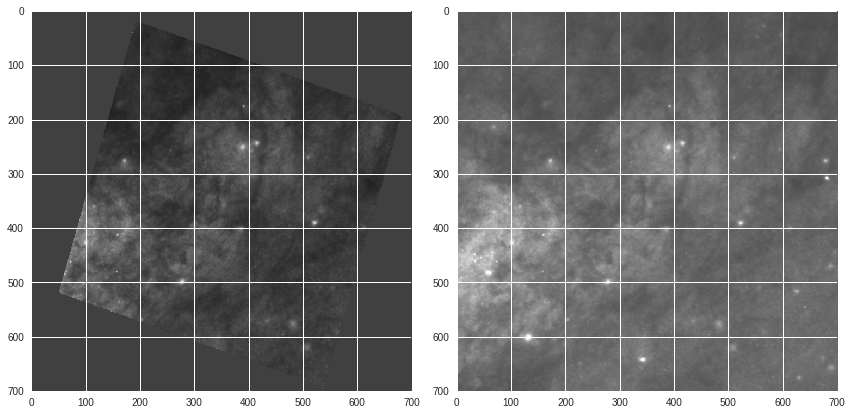

In [0]:
fig=plt.figure(figsize=(12,6))
ax=plt.subplot(1,2,1)
plt.imshow(np.squeeze(inp),cmap='gray',vmin=-1,vmax=3)
ax=plt.subplot(1,2,2)
plt.imshow(np.squeeze(ref),cmap='gray',vmin=-1,vmax=3)
plt.tight_layout()

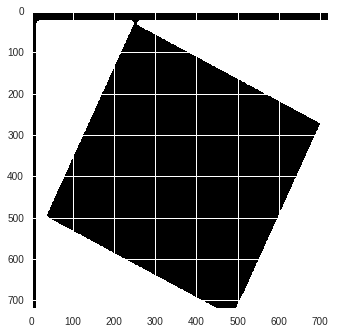

In [0]:
inp_mask=edgemask(np.squeeze(inp))
ref_mask=edgemask(np.squeeze(ref))
mask=maskmult(inp_mask,ref_mask)
plt.imshow(mask)

In [0]:
#model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=True)
#print(model.summary())
#model.compile(optimizer=keras.optimizers.Adam(0.01,decay=0.),\
#                      loss='mae',
#                      metrics=['mae'])
#model.fit(inp[np.newaxis,...],(mask*np.squeeze(ref))[np.newaxis,...,np.newaxis],verbose=0,\
#                batch_size=32,\
#                  epochs=1024,\
#                  )

In [0]:
model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=False,
                 bias=True,px=17,dropout=0.,kcube_init=True,l1=0.)
model01Fs=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01Fs.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=True,
                 bias=False,px=17,dropout=0.,kcube_init=True,l1=0.)
model01Ts=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01Ts.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])

model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=False,
                 bias=True,px=17,dropout=0.,kcube_init=True,l1=0.1)
model01FsL1=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01FsL1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=True,
                 bias=False,px=17,dropout=0.,kcube_init=True,l1=0.1)
model01TsL1=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01TsL1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])


Epoch 00202: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00303: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00403: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00503: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 00603: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 00703: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 00803: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 00903: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01003: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01103: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 01203: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 01303: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 01403: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

0.01240336149930954

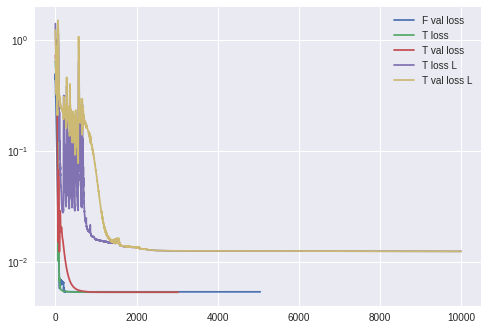

In [0]:
#plt.plot(model01Fs.history.history['loss'],label='F loss')  
plt.plot(model01Fs.history.history['val_loss'],label='F val loss')  
plt.plot(model01Ts.history.history['loss'],label='T loss')  
plt.plot(model01Ts.history.history['val_loss'],label='T val loss') 
#plt.plot(model01FsL1.history.history['loss'],label='F loss L')  
#plt.plot(model01FsL1.history.history['val_loss'],label='F val loss L')  
plt.plot(model01TsL1.history.history['loss'],label='T loss L')  
plt.plot(model01TsL1.history.history['val_loss'],label='T val loss L')
plt.yscale('log')
plt.legend()
plt.show()
# So what this shows is that using batchnorm does make a mess of the difference 
# between train and predict for a while but then the two level out. On
# the flip side, the batchnorm with l1=0 ends the soonest. Need to see
# if that's the case with more data...

('MAE: ', 0.017375566, 0.643511)
('MAPE:', 2.721261605620384, 106.79470300674438)
('SSIM:', 0.9700759646685816, 0.44056647010376676)


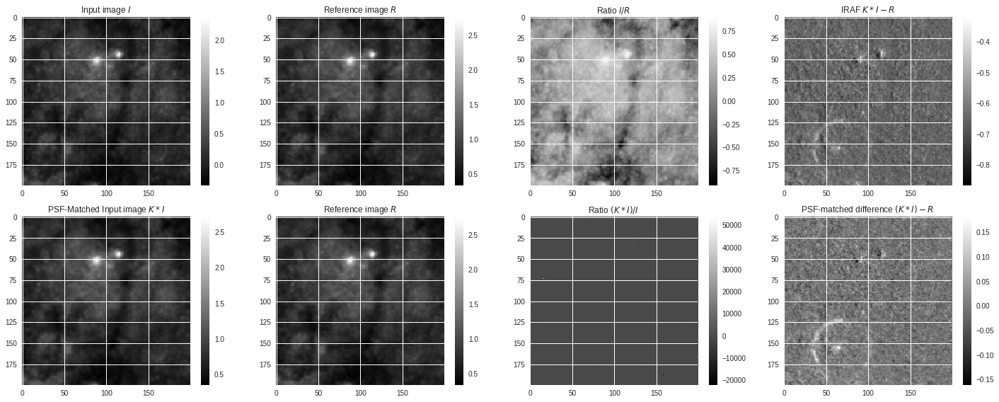

('MAE: ', 0.017487677, 0.643511)
('MAPE:', 2.7346542105078697, 106.79470300674438)
('SSIM:', 0.9705364261838506, 0.44056647010376676)


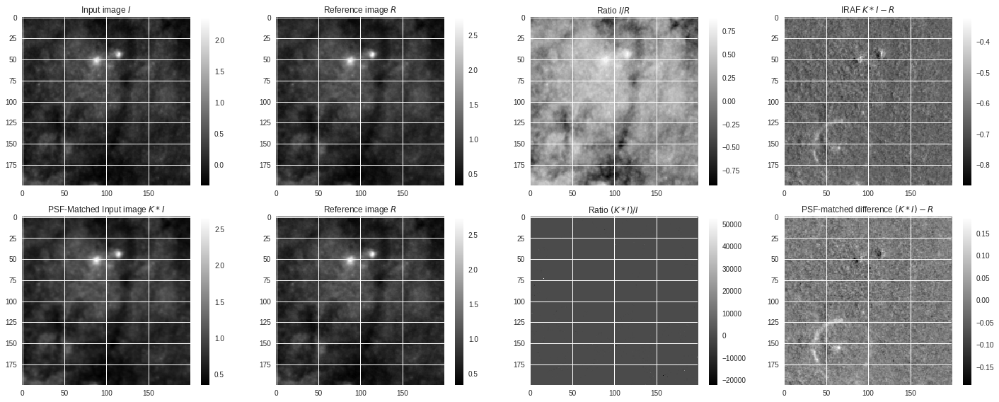

In [0]:
plot(model01Fs,inp,ref,mask,dim)

plot(model01TsL1,inp,ref,mask,dim)


In [0]:
'''model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=False,
                 bias=True,px=17,dropout=0.,kcube_init=True,l1=0.)
model01Fs=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01Fs.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])'''
model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=True,
                 bias=False,px=17,dropout=0.,kcube_init=True,l1=0.)
model01Ts=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10000,verbose=False,batch_size=512,
                lr=0.01,reduce_patience=100,stop_patience=1000,decay=10.**-0.25)
model01Ts.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])


Epoch 00199: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00696: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00805: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00905: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01005: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01105: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01205: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01305: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01405: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01505: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 01605: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 01705: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 01805: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

0.005306323990225792

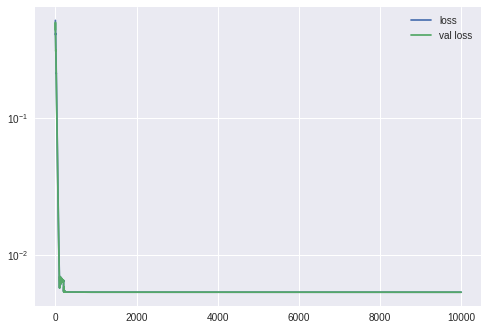

('MAE: ', 0.017362006, 0.643511)
('MAPE:', 2.71893497556448, 106.79470300674438)
('SSIM:', 0.9701478867080703, 0.44056647010376676)


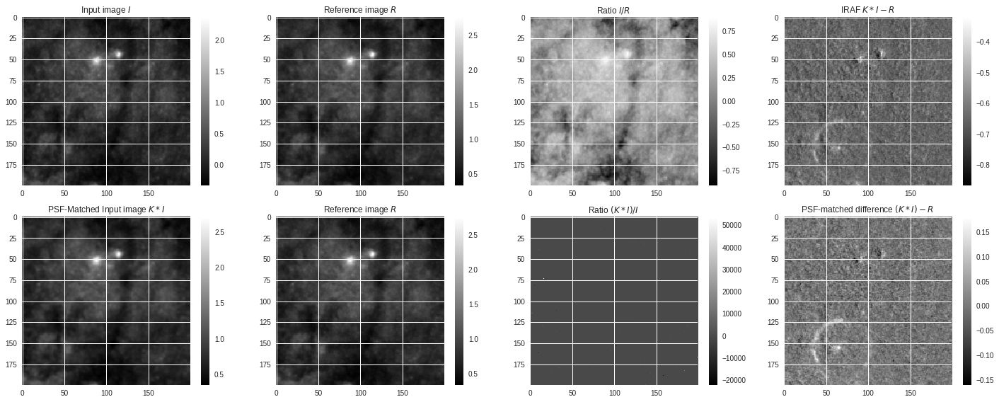

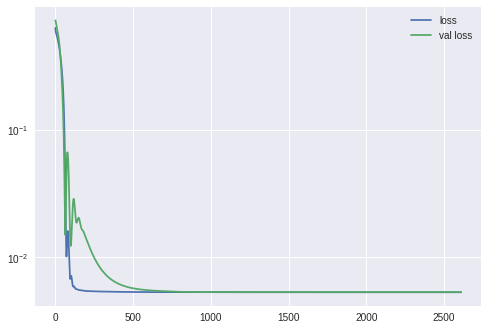

('MAE: ', 0.01720895, 0.643511)
('MAPE:', 2.6927370578050613, 106.79470300674438)
('SSIM:', 0.9711843314825672, 0.44056647010376676)


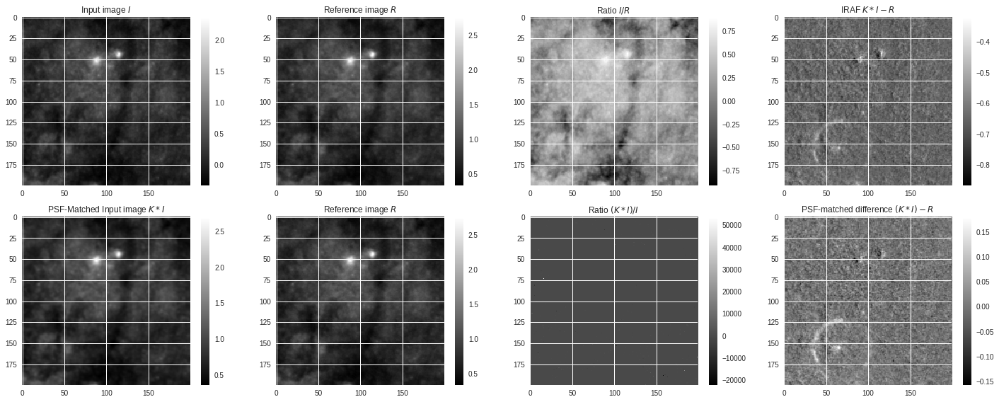

In [0]:
#model=psfmatch01(inp.shape,mask=mask,iters=1,nonlinear=False,batchnorm=True,
#                 bias=False,px=17,dropout=0.,kcube_init=True,l1=0.01)
#model.load_weights('/content/gdrive/psf/20190123_0326.hdf5')
plt.plot(model01Fs.history.history['loss'],label='loss')  
plt.plot(model01Fs.history.history['val_loss'],label='val loss')  
plt.yscale('log')
plt.legend()
plt.show()
plot(model01Fs,inp,ref,mask,dim)

plt.plot(model01Ts.history.history['loss'],label='loss')  
plt.plot(model01Ts.history.history['val_loss'],label='val loss')  
plt.yscale('log')
plt.legend()
plt.show()
plot(model01Ts,inp,ref,mask,dim)

(-499.95000000000005, 10498.95, -0.030999161209911107, 0.7677150386385619)


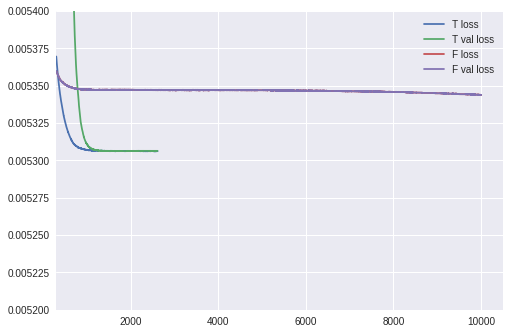

In [0]:
plt.plot(model01Ts.history.history['loss'],label='T loss')  
plt.plot(model01Ts.history.history['val_loss'],label='T val loss')  
plt.plot(model01Fs.history.history['loss'],label='F loss')  
plt.plot(model01Fs.history.history['val_loss'],label='F val loss') 
#plt.yscale('log')
x1,x2,y1,y2 = plt.axis()
print(x1,x2,y1,y2)
plt.axis((300,x2,0.0052,0.0054))
plt.legend()
plt.show()

In [0]:
model=test(inp.shape,mask=mask,kcube_init=True,nsub=1)
model01=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024,verbose=True,lr=0.01)


In [0]:
model=psfmatch02(inp.shape,mask=mask,iters=3,nonlinear=False,batchnorm=True,
                 bias=True,px=15,dropout=0.)
model029159=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024,)

In [0]:
model=psfmatch03(inp.shape,mask=mask,nonlinear=True,batchnorm=True,
                 bias=True,px=15,dropout=0.)
model0315=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024,)

(0.0043548495, 0.16386972)
(0.6803728174418211, 27.183154225349426)


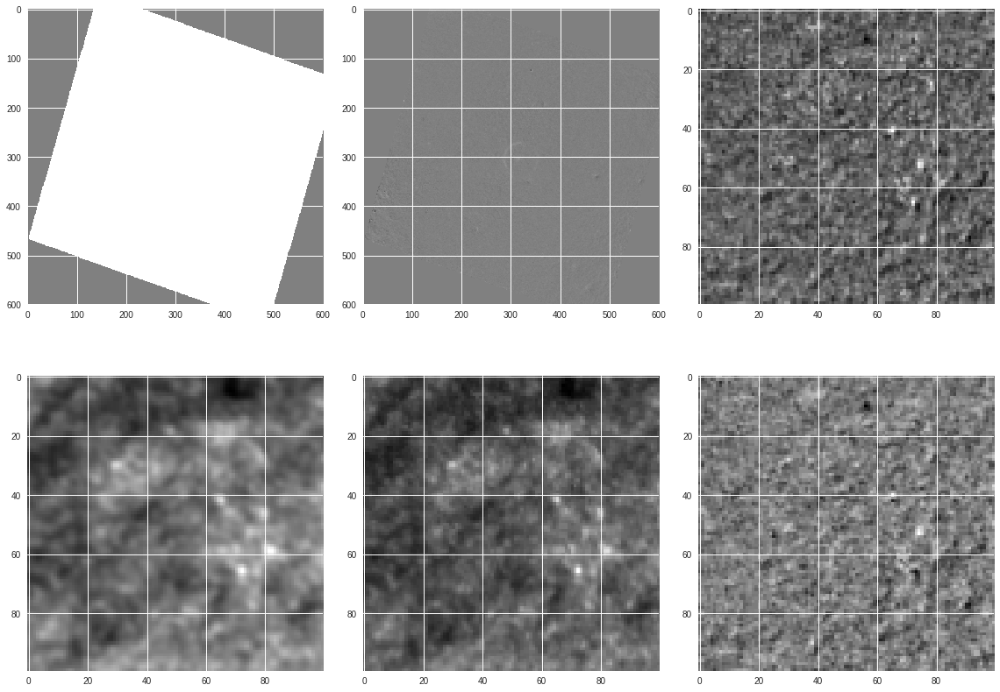

In [0]:
x=model17p1a.predict(inp[np.newaxis,...])
dimage=mask*(np.squeeze(x)-np.squeeze(ref+1))
simage=mask*(0.97*np.squeeze(inp)-np.squeeze(ref))
print(np.mean(np.abs(dimage)),np.mean(np.abs(simage)))
print(100*np.mean(np.abs(dimage/np.squeeze(ref+1.e-6))),
      100*np.mean(np.abs(simage/np.squeeze(ref+1.e-6))))

fig=plt.figure(figsize=(16,12))
ax=plt.subplot(2,3,1)
plt.imshow(np.squeeze(x)[200:800,200:800],cmap='gray',vmin=-1,vmax=1)
ax=plt.subplot(2,3,2)
plt.imshow(dimage[200:800,200:800],cmap='gray',vmin=-1,vmax=1)
ax=plt.subplot(2,3,3)
plt.imshow(simage[600:700,600:700],cmap='gray',)

ax=plt.subplot(2,3,4)
plt.imshow(np.squeeze(x)[600:700,600:700],cmap='gray')
ax=plt.subplot(2,3,5)
plt.imshow(np.squeeze(inp)[600:700,600:700],cmap='gray')
ax=plt.subplot(2,3,6)
plt.imshow(dimage[600:700,600:700],cmap='gray')
plt.tight_layout()


In [0]:
model=psfmatch05(inp.shape,mask=mask,l1=0.0,batchnorm=True,bias=False)
model05Ts=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512,
          reduce_patience=100,stop_patience=300,lr=0.01,decay=10.**-0.25,min_lr=1.e-7)
model05Ts.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
model=psfmatch05(inp.shape,mask=mask,l1=0.0,batchnorm=False,bias=True)
model05Fs=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512,
          reduce_patience=100,stop_patience=300,lr=0.01,decay=10.**-0.25,min_lr=1.e-7)
model05Fs.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])


Epoch 00254: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00971: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 01071: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 01193: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01308: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01408: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01508: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01608: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01708: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01808: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 01908: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02008: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02108: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

0.7344406247138977

(-130.65, 2743.65, 0.0037500097039132284, 7.555230702887409)


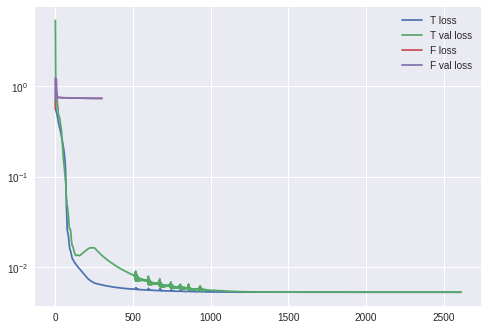

('MAE: ', 0.017383162, 0.643511)
('MAPE:', 2.7199996635317802, 106.79470300674438)
('SSIM:', 0.9701976179343602, 0.44056647010376676)


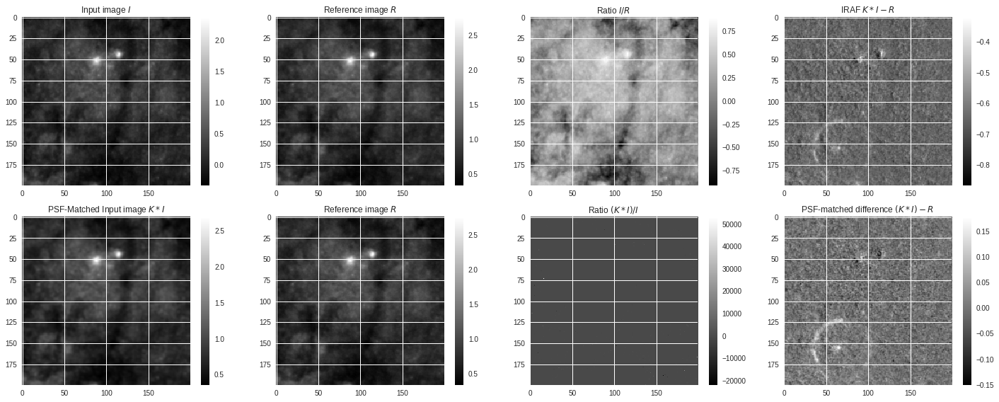

In [0]:
plt.plot(model05Ts.history.history['loss'],label='T loss')  
plt.plot(model05Ts.history.history['val_loss'],label='T val loss')  
plt.plot(model05Fs.history.history['loss'],label='F loss')  
plt.plot(model05Fs.history.history['val_loss'],label='F val loss') 
plt.yscale('log')
x1,x2,y1,y2 = plt.axis()
print(x1,x2,y1,y2)
#plt.axis((300,x2,2.5,3))
plt.legend()
plt.show()
plot(model05Ts,inp,ref,mask,dim)

In [0]:
inp_mat01=model01F6.predict(inp[np.newaxis,...])
inp_mat06=model06F.predict(inp[np.newaxis,...])
refm=ref*mask[:,:,np.newaxis]
print(refm.max(),refm.min(),np.mean(refm),np.std(refm))
print(K.eval(ssim_multiscale(K.variable(inp_mat01),K.variable(refm[np.newaxis,...]),np.max(refm)-np.min(refm))))
print(K.eval(ssim_multiscale(K.variable(inp_mat06),K.variable(refm[np.newaxis,...]),np.max(refm)-np.min(refm))))
print(ssim(np.squeeze(inp_mat01),np.squeeze(refm),3))
print(ssim(np.squeeze(inp_mat06),np.squeeze(refm),3))

(3.3043156, 0.0, 0.36530957, 0.38869765)
[0.99611676]
[0.9960991]
0.9712415132107766
0.9707880030806544


('MAE: ', 0.047149714, 0.643511)
('MAPE:', 6.232075020670891, 106.79470300674438)
('SSIM:', 0.9358652924143045, 0.44056647010376676)


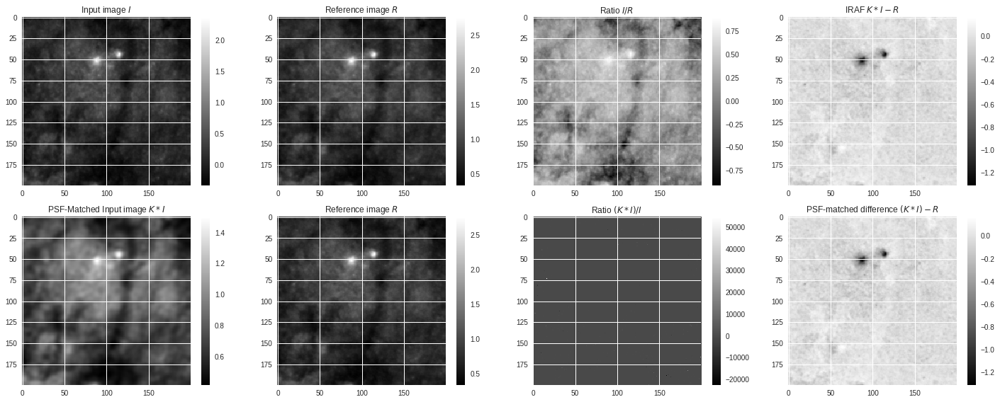

In [0]:
model06.load_weights('/content/gdrive/psf/20190123_0346.hdf5')
plot(model06,inp,ref,mask,dimage=dim)

iters=1,nonlinear=False, batchnorm=True,epochs=1024: (0.01733722910284996, 0.06476712971925735)

iters=2,nonlinear=False, batchnorm=True,epochs=1024: (0.022127553820610046, 0.08560086041688919)

iters=1,nonlinear=False,batchnorm=False,epochs=1024: 0.05. 

iters=1,nonlinear=True,batchnorm=False,epochs=1024: 0.0355. 

iters=2,nonlinear=True,batchnorm=False,epochs=1024: 0.06. 

iters=1, nonlinear-, batch+, epochs=128, mape: mape 0.6786888837814331, 0.004343994427472353

using psfmatch02 with 3x15x15 I get to the answer 2x as fast. 
 honestly the activations seem to slow this down. if one wants
 to make a nonlinear kernel, there has to be a different way...
 
 psfmatch01 shows that using larger kernels gets to answer faster too, 
 so there really may be no need for the 3-D mess afterall...except to 
 look fancy... An experiment of plotting loss showed that using
 psfmatch02 fell sharply at first but then joined up with psfmatch01 with a large kernel at about the same number of iterations. psfmatch02 with a single elu at the end
 does reach the solution the fastest, and it gets there faster as I use more layers and larger pn
 
 mse fails...it gets stuck at a bad pattern with mape about twice the best possible (and it looks awful. However, I have a few concerns about mape--first of all, is it statistically established as valid. Second, what is the mape when the reference value is 0? Do we add a scalar constant to each image so min(ref)=1, for example? )
 
 What about this as an idea? multiscale with gaussian pyramid. https://github.com/SeungjunNah/DeepDeblur_release
 
 Check this out: a whole lot of CNN-based super res
 https://github.com/27tech/keras-image-upsample
 
 https://arxiv.org/pdf/1511.08861.pdf image loss function
 
 


[array([-0.19427198], dtype=float32), array([0.1294883], dtype=float32), array([0.65594584], dtype=float32), array([-0.16190009], dtype=float32), array([0.19613303], dtype=float32)]
[array([-0.06669851], dtype=float32), array([-0.12757175], dtype=float32), array([0.6536327], dtype=float32), array([-0.15986885], dtype=float32), array([1.295737], dtype=float32)]


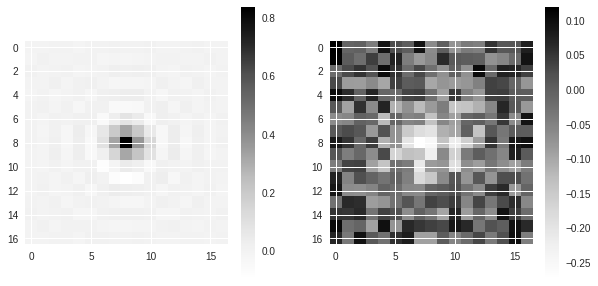

In [0]:
fig=plt.figure(figsize=(10,5))
ax=plt.subplot(1,2,1)
w=model17p0a.get_weights()
k=np.squeeze(w[0])
plt.imshow(k)
plt.colorbar()
ax=plt.subplot(1,2,2)
print(w[1:])
w=model17p0b.get_weights()
k=np.squeeze(w[0])
plt.imshow(k)
plt.colorbar()
print(w[1:])

In [0]:
[]np.average(np.abs(i))

0.16354404

In [0]:
np.average(i**2)

0.10550321

loss 0.09446299821138382
lr 0.1
mean_absolute_error 0.19894707202911377


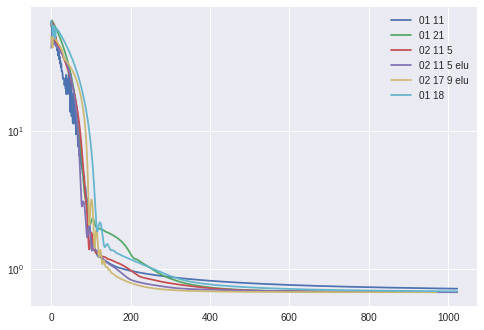

In [0]:
plt.plot(model11.history.history['loss'],label='01 11')
plt.plot(model21.history.history['loss'],label='01 21')  
plt.plot(model02511.history.history['loss'],label='02 11 5')  
plt.plot(model02511e.history.history['loss'],label='02 11 5 elu')  
plt.plot(model02917e.history.history['loss'],label='02 17 9 elu')  
#plt.plot(model0315.history.history['loss'],label='03 1-3-1')  
plt.plot(model0118.history.history['loss'],label='01 18')  

plt.yscale('log')
plt.legend()
plt.show()

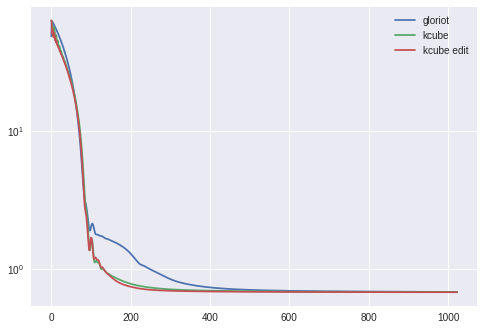

In [0]:
plt.plot(model0117.history.history['loss'],label='gloriot')
plt.plot(model0117k.history.history['loss'],label='kcube')  
plt.plot(model0117j.history.history['loss'],label='kcube edit')  

plt.yscale('log')
plt.legend()
plt.show()

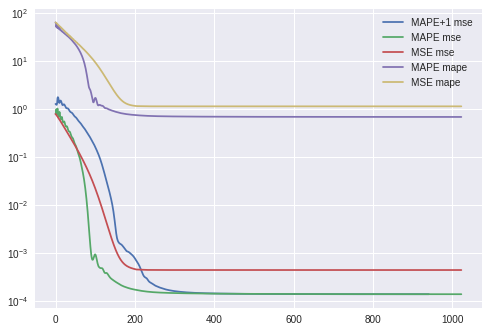

In [0]:

plt.plot(model17p1a.history.history['mean_squared_error'],label='MAPE+1 mse')
#plt.plot(model17p1b.history.history['loss'],label='gloriot+1')  
plt.plot(model17p0a.history.history['mean_squared_error'],label='MAPE mse')
plt.plot(model17mse.history.history['mean_squared_error'],label='MSE mse')  
plt.plot(model17p0a.history.history['mean_absolute_percentage_error'],label='MAPE mape')
plt.plot(model17mse.history.history['mean_absolute_percentage_error'],label='MSE mape')  

plt.yscale('log')
plt.legend()
plt.show()

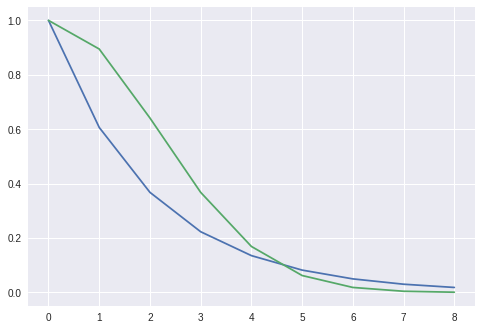

In [0]:
x=np.arange(9)
plt.plot(x,np.exp(-x/2.))
plt.plot(x,Gaussian(x,3.))

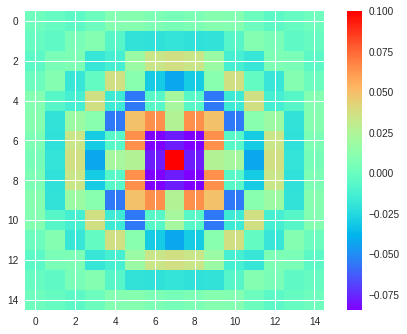

In [0]:
100*np.mean(np.abs((inp-ref)/(ref+0.00001)))

85.87949872016907

In [0]:
"""
Clean and simple Keras implementation of network architectures described in:
    - (ResNet-50) [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf).
    - (ResNeXt-50 32x4d) [Aggregated Residual Transformations for Deep Neural Networks](https://arxiv.org/pdf/1611.05431.pdf).
    
Python 3.

https://gist.github.com/mjdietzx/0cb95922aac14d446a6530f87b3a04ce#file-residual_network-py
"""

from keras import layers
from keras import models


#
# image dimensions
#

img_height = 224
img_width = 224
img_channels = 3

#
# network params
#

cardinality = 32


def residual_network(x):
    """
    ResNeXt by default. For ResNet set `cardinality` = 1 above.
    
    """
    def add_common_layers(y):
        y = layers.BatchNormalization()(y)
        y = layers.LeakyReLU()(y)

        return y

    def grouped_convolution(y, nb_channels, _strides):
        # when `cardinality` == 1 this is just a standard convolution
        if cardinality == 1:
            return layers.Conv2D(nb_channels, kernel_size=(3, 3), strides=_strides, padding='same')(y)
        
        assert not nb_channels % cardinality
        _d = nb_channels // cardinality

        # in a grouped convolution layer, input and output channels are divided into `cardinality` groups,
        # and convolutions are separately performed within each group
        groups = []
        for j in range(cardinality):
            group = layers.Lambda(lambda z: z[:, :, :, j * _d:j * _d + _d])(y)
            groups.append(layers.Conv2D(_d, kernel_size=(3, 3), strides=_strides, padding='same')(group))
            
        # the grouped convolutional layer concatenates them as the outputs of the layer
        y = layers.concatenate(groups)

        return y

    def residual_block(y, nb_channels_in, nb_channels_out, _strides=(1, 1), _project_shortcut=False):
        """
        Our network consists of a stack of residual blocks. These blocks have the same topology,
        and are subject to two simple rules:
        - If producing spatial maps of the same size, the blocks share the same hyper-parameters (width and filter sizes).
        - Each time the spatial map is down-sampled by a factor of 2, the width of the blocks is multiplied by a factor of 2.
        """
        shortcut = y

        # we modify the residual building block as a bottleneck design to make the network more economical
        y = layers.Conv2D(nb_channels_in, kernel_size=(1, 1), strides=(1, 1), padding='same')(y)
        y = add_common_layers(y)

        # ResNeXt (identical to ResNet when `cardinality` == 1)
        y = grouped_convolution(y, nb_channels_in, _strides=_strides)
        y = add_common_layers(y)

        y = layers.Conv2D(nb_channels_out, kernel_size=(1, 1), strides=(1, 1), padding='same')(y)
        # batch normalization is employed after aggregating the transformations and before adding to the shortcut
        y = layers.BatchNormalization()(y)

        # identity shortcuts used directly when the input and output are of the same dimensions
        if _project_shortcut or _strides != (1, 1):
            # when the dimensions increase projection shortcut is used to match dimensions (done by 1×1 convolutions)
            # when the shortcuts go across feature maps of two sizes, they are performed with a stride of 2
            shortcut = layers.Conv2D(nb_channels_out, kernel_size=(1, 1), strides=_strides, padding='same')(shortcut)
            shortcut = layers.BatchNormalization()(shortcut)

        y = layers.add([shortcut, y])

        # relu is performed right after each batch normalization,
        # expect for the output of the block where relu is performed after the adding to the shortcut
        y = layers.LeakyReLU()(y)

        return y

    # conv1
    x = layers.Conv2D(64, kernel_size=(7, 7), strides=(2, 2), padding='same')(x)
    x = add_common_layers(x)

    # conv2
    x = layers.MaxPool2D(pool_size=(3, 3), strides=(2, 2), padding='same')(x)
    for i in range(3):
        project_shortcut = True if i == 0 else False
        x = residual_block(x, 128, 256, _project_shortcut=project_shortcut)

    # conv3
    for i in range(4):
        # down-sampling is performed by conv3_1, conv4_1, and conv5_1 with a stride of 2
        strides = (2, 2) if i == 0 else (1, 1)
        x = residual_block(x, 256, 512, _strides=strides)

    # conv4
    for i in range(6):
        strides = (2, 2) if i == 0 else (1, 1)
        x = residual_block(x, 512, 1024, _strides=strides)

    # conv5
    for i in range(3):
        strides = (2, 2) if i == 0 else (1, 1)
        x = residual_block(x, 1024, 2048, _strides=strides)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(1)(x)

    return x


image_tensor = layers.Input(shape=(img_height, img_width, img_channels))
network_output = residual_network(image_tensor)
  
model = models.Model(inputs=[image_tensor], outputs=[network_output])
print(model.summary())

In [0]:
model=test((100,100,1),nsub=3)
model.compile(optimizer=keras.optimizers.Adam(0.1,decay=0.),\
                      loss='logcosh',
                      metrics=['mae'])
model.summary()

(100, 100, 8, 34, 34)
('section', 0, 34, 0, 34)
('section', 34, 68, 0, 34)
('section', 68, 102, 0, 34)
('section', 0, 34, 34, 68)
('section', 34, 68, 34, 68)
('section', 68, 102, 34, 68)
('section', 0, 34, 68, 102)
('section', 34, 68, 68, 102)
('section', 68, 102, 68, 102)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           (None, 100, 100, 1)  0                                            
__________________________________________________________________________________________________
lambda_616 (Lambda)             (None, 100, 100, 1)  0           input_18[0][0]                   
__________________________________________________________________________________________________
lambda_617 (Lambda)             (None, 100, 100, 1)  0           lambda_616[0][0]                 
_________________________________

In [0]:
model=test(inp.shape,mask=mask,nsub=2,px=17)
modelsub2=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024)


(0.004205817, 0.16386972)
(0.6559473928064108, 27.183154225349426)


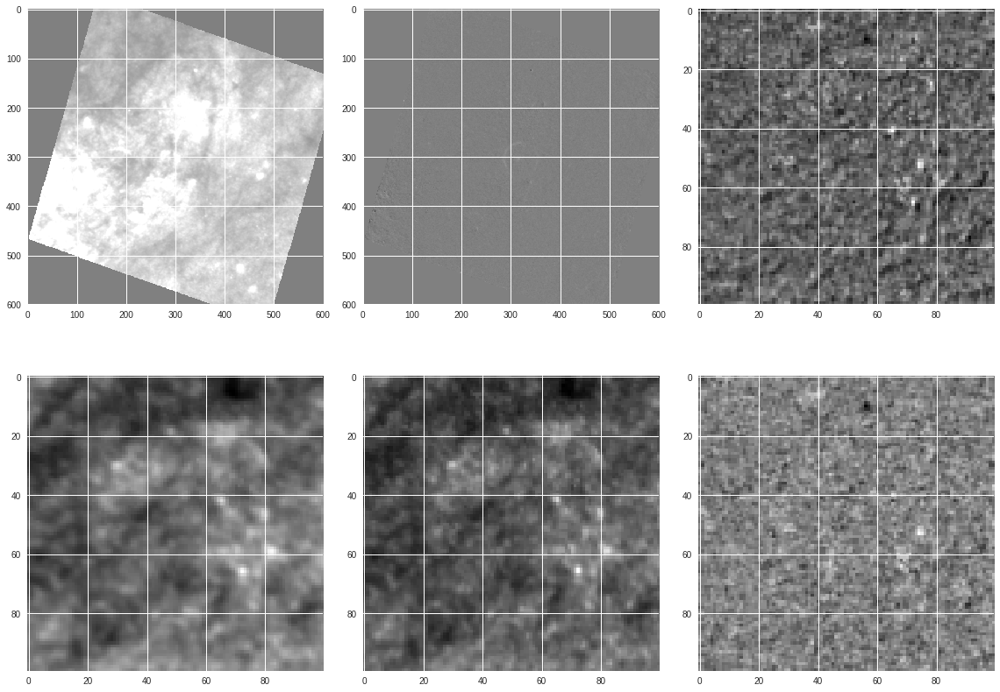

In [0]:
plot(model)

In [0]:
model=test(inp.shape,mask=mask,nsub=1,px=17,kcube_init=False)
modelsub1a=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024)


(0.0043650526, 0.16386972)
(0.6830741185694933, 27.183154225349426)


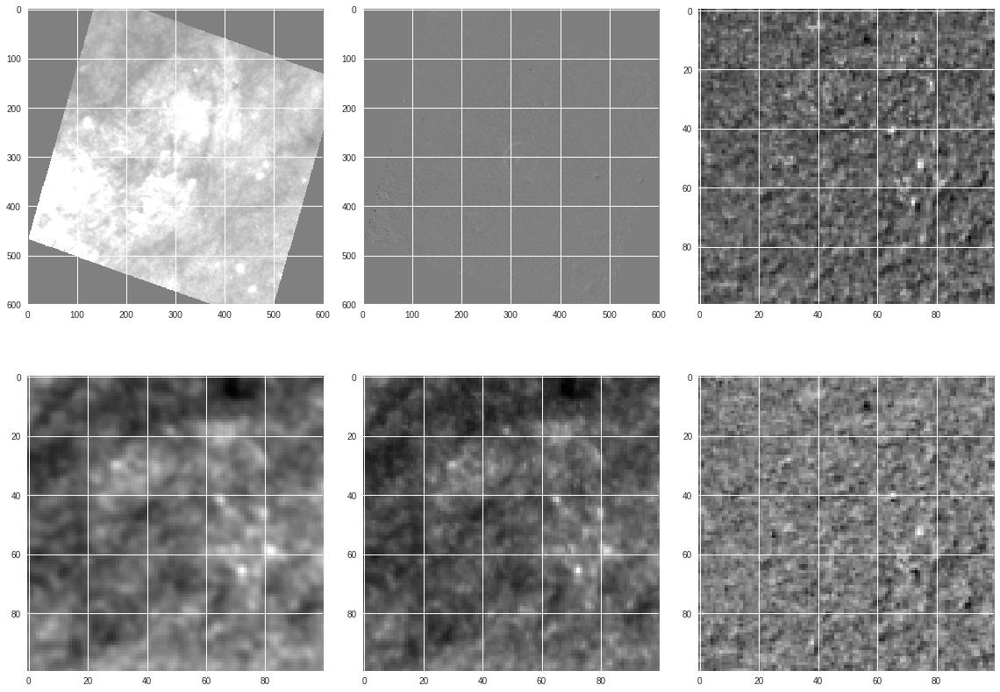

In [0]:
plot(modelsub1)

In [0]:
model=test(inp.shape,mask=mask,nsub=3,px=17)
modelsub3=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=1024)


(0.0043650526, 0.16386972)
(0.6830741185694933, 27.183154225349426)


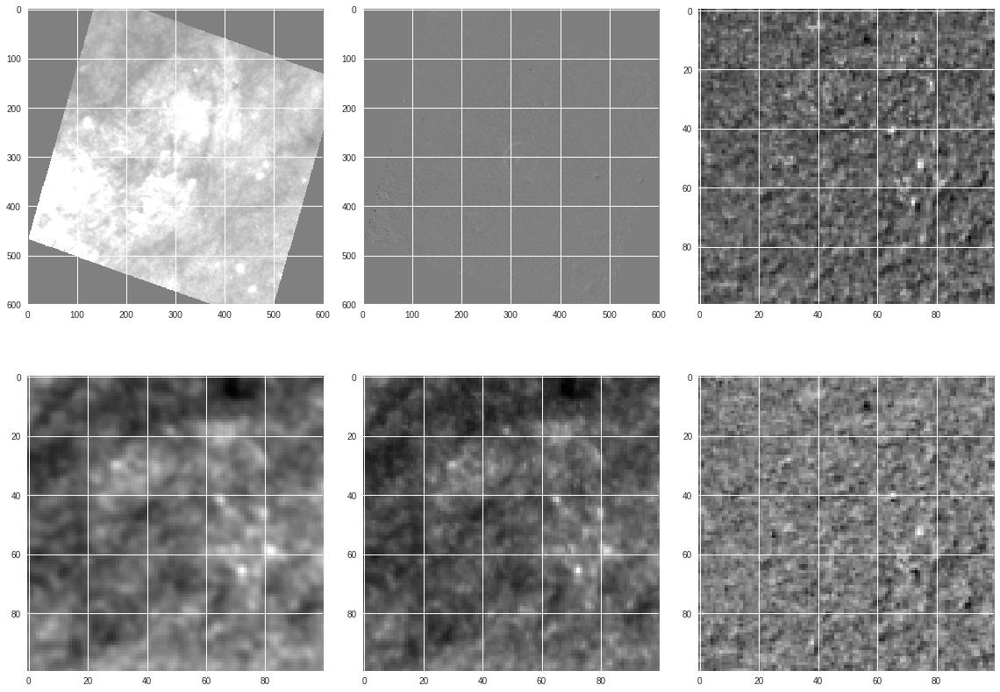

In [0]:
plot(modelsub1)

3.2285101
-3.458301


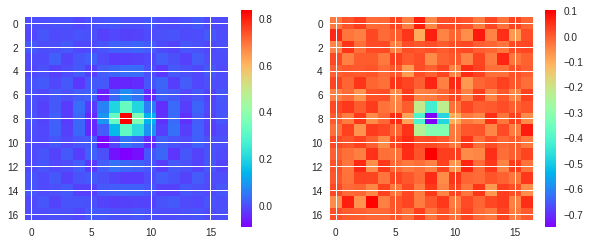

In [0]:
fig=plt.figure(figsize=(10,4))
ax=plt.subplot(1,2,1)
plt.imshow(np.squeeze(modelsub1.get_weights()[0]),cmap='rainbow')
plt.colorbar()
ax=plt.subplot(1,2,2)
plt.imshow(np.squeeze(modelsub1a.get_weights()[0]),cmap='rainbow')
plt.colorbar()

print(np.sum(modelsub1.get_weights()[0]))
print(np.sum(modelsub1a.get_weights()[0]))

(0.016858114, 0.16386972)
(2.833094075322151, 27.183154225349426)


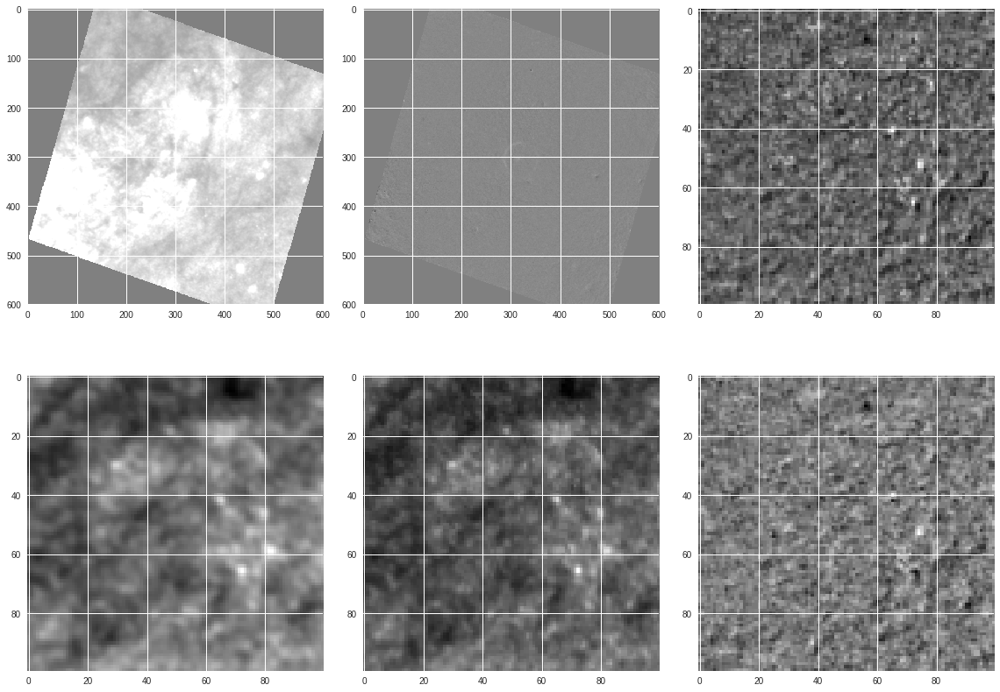

In [0]:
plot(modelsub1a)

In [0]:
tmp=np.squeeze(tmp)

In [0]:
np.mean(tmp[400:450,400:450])

1.588024

In [0]:
weights=modelsub1.get_weights()
np.sum(weights[1:])

0.6297425

In [0]:
!ls /content/gdrive/dif*


/content/gdrive/dif2.pkl  /content/gdrive/dif3.pkl  /content/gdrive/dif.pkl


(724, 724, 1)
8.986575156450272


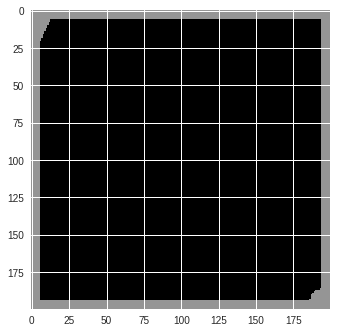

In [0]:
inp,ref,dim=pickle.load(open('/content/gdrive/dif3.pkl','rb'))
print(ref.shape)
#inp=inp[200:900,150:850,:]
#ref=ref[200:900,150:850,:]
inp=inp[170:370,170:370,:]
ref=ref[170:370,170:370,:]
dim=dim[170:370,170:370,:]

np.squeeze(inp).shape
inp_mask=edgemask(np.squeeze(inp),max=10)
ref_mask=edgemask(np.squeeze(ref),max=10)
mask=maskmult(inp_mask,ref_mask)
print(100*np.mean(np.abs(mask[...,np.newaxis]*(inp-ref)/(ref+1.e-6))))
plt.imshow(mask,vmin=-1,vmax=1)

In [0]:
q=np.abs(mask[...,np.newaxis]*(inp-ref)/(ref+1.e-6))
tmp=q[mask>0]
print(q.shape,tmp.shape)
print(100*np.mean(q),100*np.mean(tmp),masked_mape(ref,inp,mask))
print(np.mean(np.abs(inp-ref)),masked_mae(inp,ref,mask))


((150, 150, 1), (18986, 1))
(8.696004748344421, 10.3054940700531, 10.305584967136383)
(0.0145985065, 0.013478829)


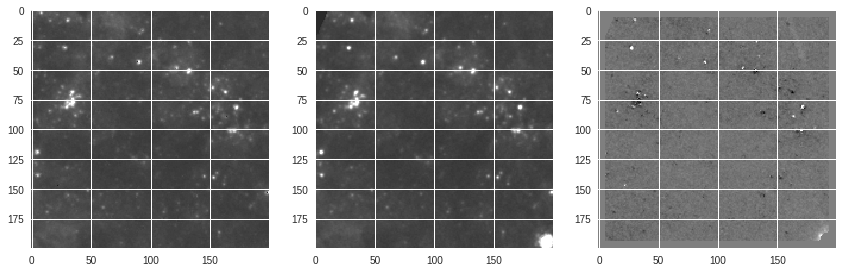

In [0]:
fig=plt.figure(figsize=(12,6))
ax=plt.subplot(1,3,1)
plt.imshow(np.squeeze(inp),cmap='gray',vmin=-0.2,vmax=1)
ax=plt.subplot(1,3,2)
plt.imshow(np.squeeze(ref),cmap='gray',vmin=-0.2,vmax=1)
ax=plt.subplot(1,3,3)
plt.imshow(mask*(np.squeeze(dim)),cmap='gray',vmin=-0.25,vmax=0.25)
plt.tight_layout()

In [0]:
model=test(inp.shape,mask=mask,l1=0.,px=15,kcube_init=False,nsub=1,
           batchnorm=True,bias=False)
modelTs=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512,
          )
modelTs.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
#model=test(inp.shape,mask=mask,l1=0.,px=15,kcube_init=False,batchnorm=False,bias=True)
#modelFs=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
#          metric='ssim',epochs=5000,verbose=False,batch_size=512,
#          reduce_patience=100,stop_patience=300,lr=0.01,decay=10.**-0.25,min_lr=1.e-6)
#modelFs.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])

(200, 200, 7, 200, 200)
('section', 0, 200, 0, 200)

Epoch 01067: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 01217: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 01367: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 01594: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01744: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01894: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 02044: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 02194: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 02344: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 02494: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02644: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02794: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02944: ReduceLROnPlateau 

0.007852417416870594

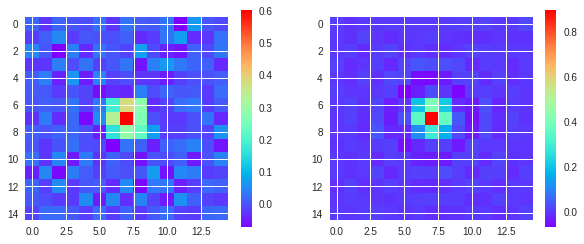

In [0]:
fig=plt.figure(figsize=(10,4))
ax=plt.subplot(1,2,1)
plt.imshow(np.squeeze(model1_2.get_weights()[0]),cmap='rainbow')
plt.colorbar()
ax=plt.subplot(1,2,2)
plt.imshow(np.squeeze(model1_3.get_weights()[0]),cmap='rainbow')
plt.colorbar()

#print(np.sum(modelTs.get_weights()[0]))
#print(np.sum(modelsub1F.get_weights()[0]))

(201, 201, 7, 201, 201)
('section', 0, 201, 0, 201)

Epoch 00337: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00577: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00747: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00912: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01089: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01262: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01412: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01624: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01774: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01924: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02074: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02224: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02374: ReduceLROnPlateau 

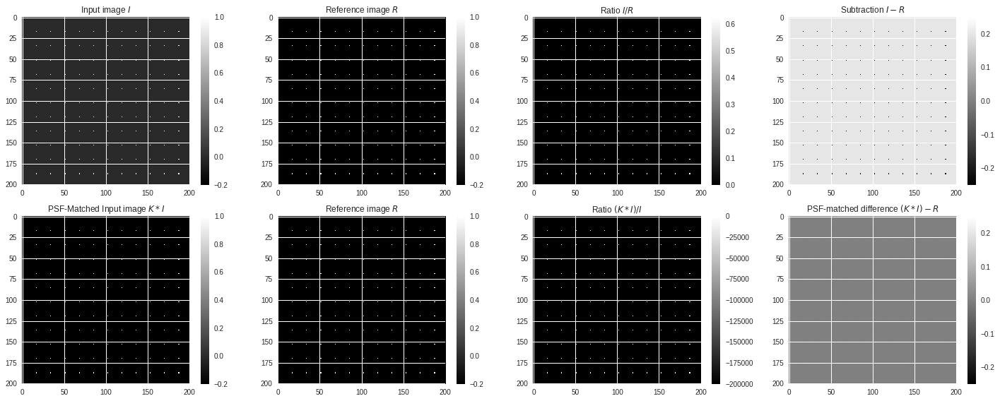

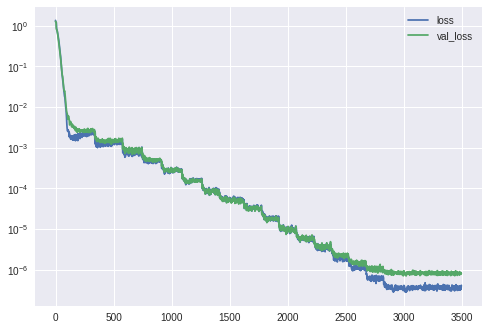

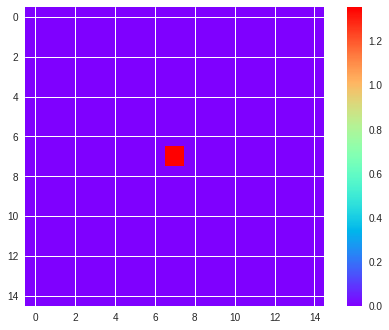

In [0]:
#make a fake situation to see whether this model actually handles different zero-point and brightness levels.
R=np.zeros((201,201,1))-0.2
P=R+0.2
mask=np.squeeze(R).astype(bool)
R[17::17,17::17,:]+=5.
P[17::17,17::17,:]+=3.
model=psfmatch(R.shape,mask=mask,px=15,kcube_init=True,nsub=1)
model1=fitModel(model,P[np.newaxis,...],R[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=32,
               optimizer='adam',stop_patience=500)
#model1.evaluate(P[np.newaxis,...],R[np.newaxis,...])
plot(model1,P,R,mask)
plt.imshow(np.squeeze(model1.get_weights()[0]),cmap='rainbow')
plt.colorbar()
plt.show()
#plt.imshow(np.squeeze(P),vmin=-0.2,vmax=1)

In [0]:
model=psfmatch05(inp.shape,mask=mask,l1=0.,px=15,kcube_init=False,nsub=1,
           batchnorm=True,bias=False)
modelT5=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512,
          )
modelT5.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])


Epoch 01064: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 01530: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 01925: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 02209: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 02431: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 02615: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 02765: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 02927: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 03077: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 03227: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 03377: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 03527: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 03677: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

0.00463546859100461

('MAE: ', 0.010722828, 0.013283757)
('MAPE:', 7.768347859382629, 10.200225561857224)
('SSIM:', 0.9672396054556972, 0.9660276827277604)


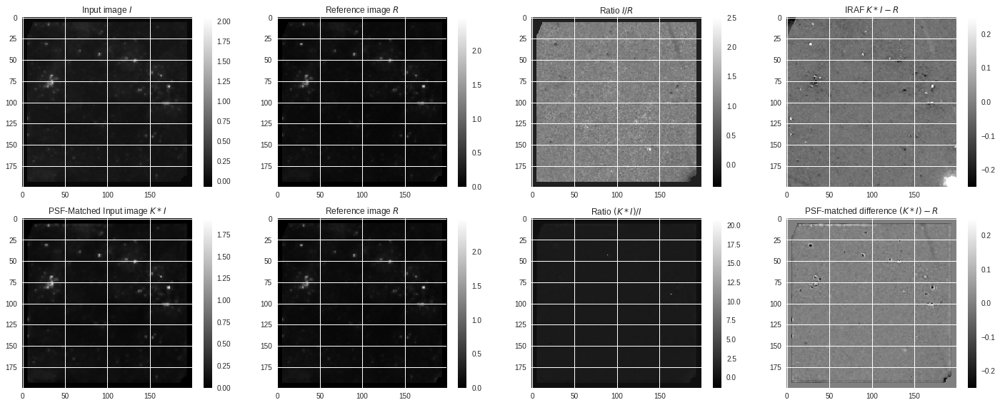

In [0]:
plot(modelT5,inp,ref,mask,iraf_dimage=np.squeeze(dim))

('MAE: ', 56.691998, 56.695576)
('MAPE:', 15.97428172826767, 17.79729574918747)
('SSIM:', 0.9333206049339969, 0.9297433182650358)


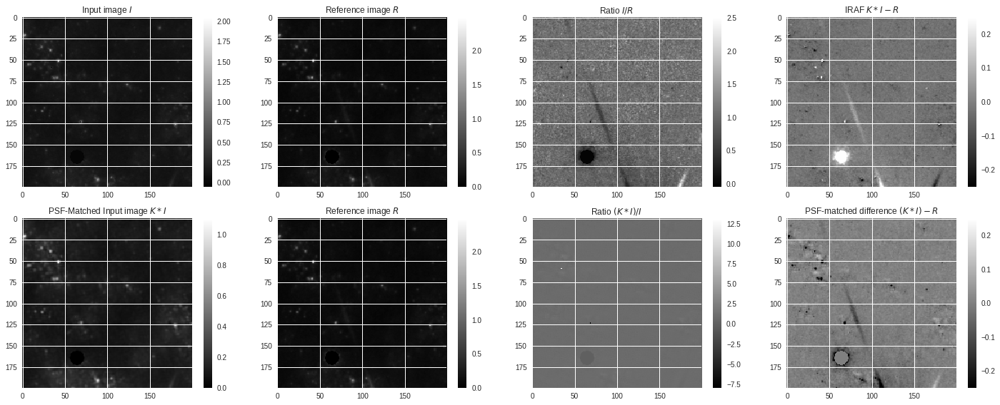

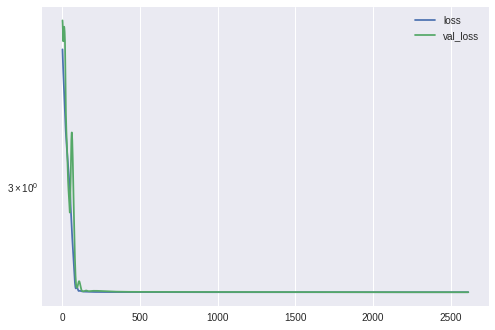

In [0]:
plot(model1,inp,ref,mask,dim)

## Explicit testing of methods on dif3.pkl


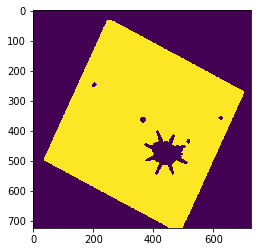

In [0]:
ref,inp,dim=pickle.load(open('/content/gdrive/dip/dif3.pkl','rb'),encoding='latin1')
inp[:30,:,:]=0
inp[:,:20,:]=0

inp_mask=edgemask(inp,max=np.percentile(inp,99))
ref_mask=edgemask(ref,max=np.percentile(ref,99))
mask=maskmult(inp_mask,ref_mask,)
plt.imshow(mask)

In [0]:
inp.shape,ref.shape

((724, 724, 1), (724, 724, 1))

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Model /content/gdrive/dip//20190529_1637.hdf5 took 0:00:06.038169 to run
MAE:  0.33180735 0.016475523
MAPE: 182.7800750732422 10.16276404261589
SSIM: 0.5283318405050635 0.9760259907477038
MAE of iraf_dimage:  0.035263993


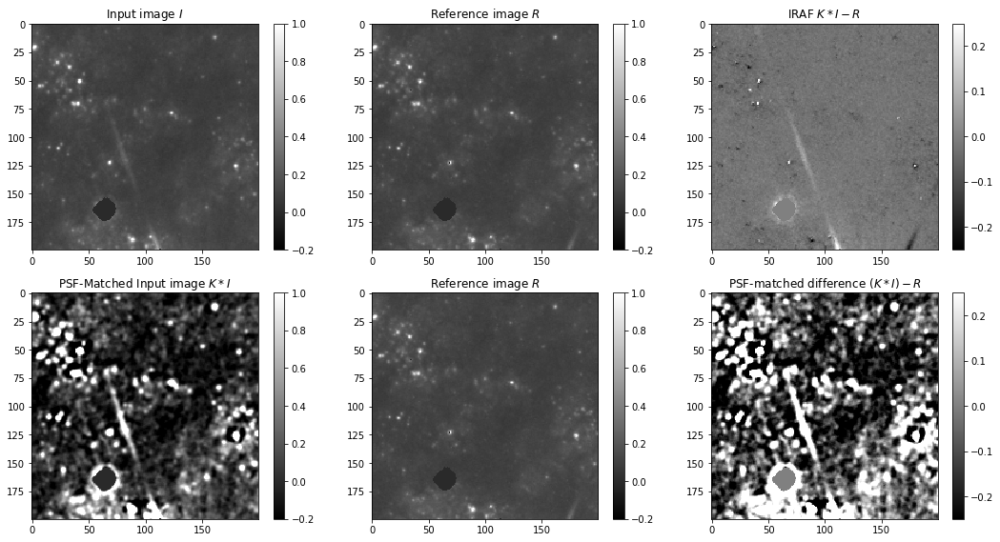

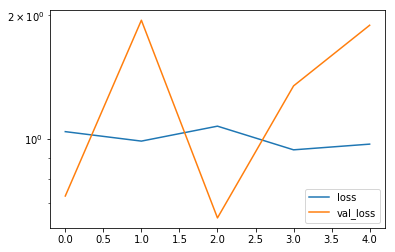

In [0]:
model=psfmatch(inp.shape,mask=mask,w=15,nsub=1)
model1=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5,verbose=False,batch_size=512)
#model1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model1,inp,ref,mask,dim)

(724, 724, 7, 362, 362)
('section', 0, 362, 0, 362)
('section', 362, 724, 0, 362)
('section', 0, 362, 362, 724)
('section', 362, 724, 362, 724)

Epoch 00320: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00420: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00942: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 01042: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01142: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01242: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01439: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01539: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01639: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01739: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 01839: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 01939: Red

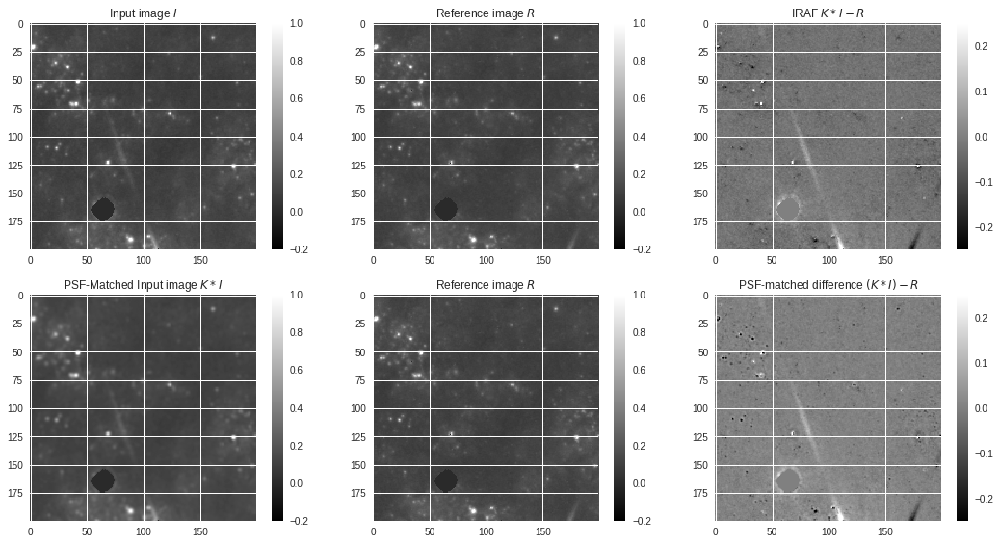

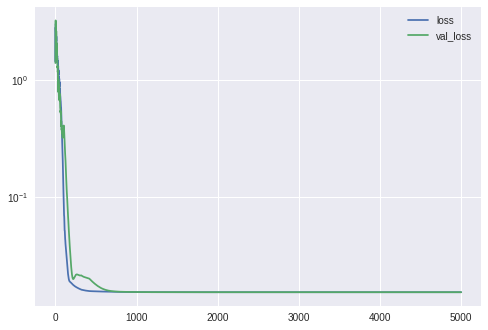

In [0]:
model=psfmatch(inp.shape,mask=mask,px=15,kcube_init=True,nsub=2)
model1_2=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model1_2.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model1_2,inp,ref,mask,dim)

In [0]:
model=psfmatch(inp.shape,mask=mask,px=15,kcube_init=True,nsub=1)
model1_3=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',l1=1.,epochs=5000,verbose=False,batch_size=512)
model1_3.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model1_3,inp,ref,mask,dim)

In [0]:
model=psfmatch(inp.shape,mask=mask,px=15,kcube_init=False,nsub=4)
model1_4=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model1_4.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model1_4,inp,ref,mask,dim)


Epoch 00125: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00255: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00355: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00455: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 00555: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 00936: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01266: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01587: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01877: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 02142: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02412: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02543: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02653: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

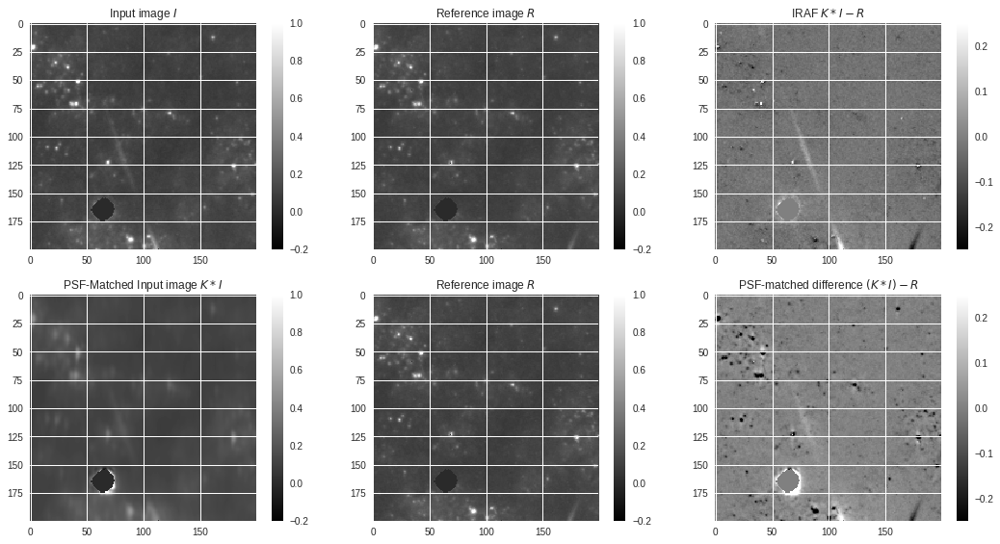

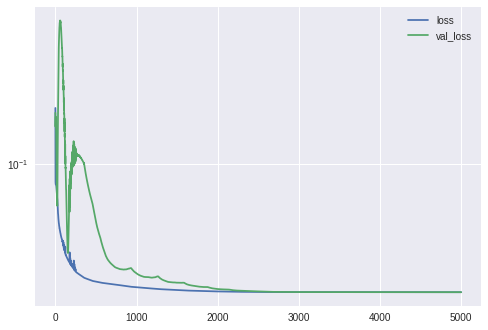

In [0]:
model=psfmatch02(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model2=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model2.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model2,inp,ref,mask,dim)


Epoch 00300: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00400: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00500: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00600: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 00700: ReduceLROnPlateau reducing learning rate to 0.0005623413519.
Epoch 00701: early stopping
loss 0.019906822592020035
lr 0.00056234136
val_loss 0.0679062232375145
Model /content/gdrive/psf/20190130_0448.hdf5 took 0:03:05.545861 to run
1/1 [==============================] - 0s 77ms/step
('MAE: ', 0.026920695, 0.016472036)
('MAPE:', 16.837692260742188, 10.162032395601273)
('SSIM:', 0.9610434884615481, 0.9760460461390378)
('MAE of iraf_dimage: ', 0.035273653)


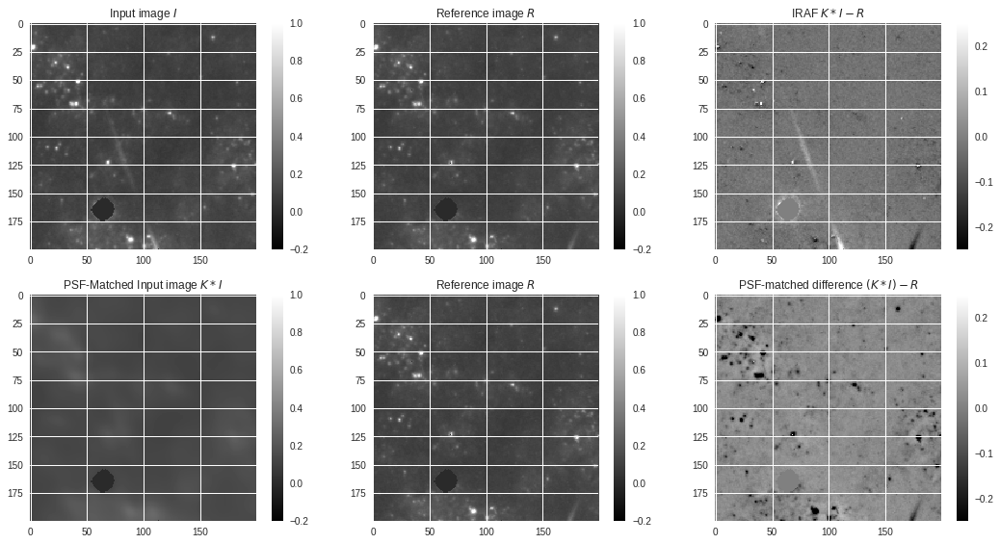

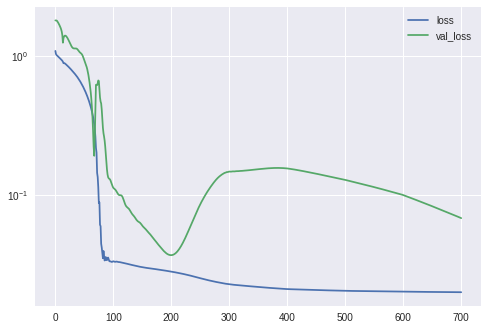

In [0]:
model=psfmatch03(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model3=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model3.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model3,inp,ref,mask,dim)


Epoch 00286: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00386: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00676: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00934: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01285: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01650: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01962: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 02218: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 02376: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 02479: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02596: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02696: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02796: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

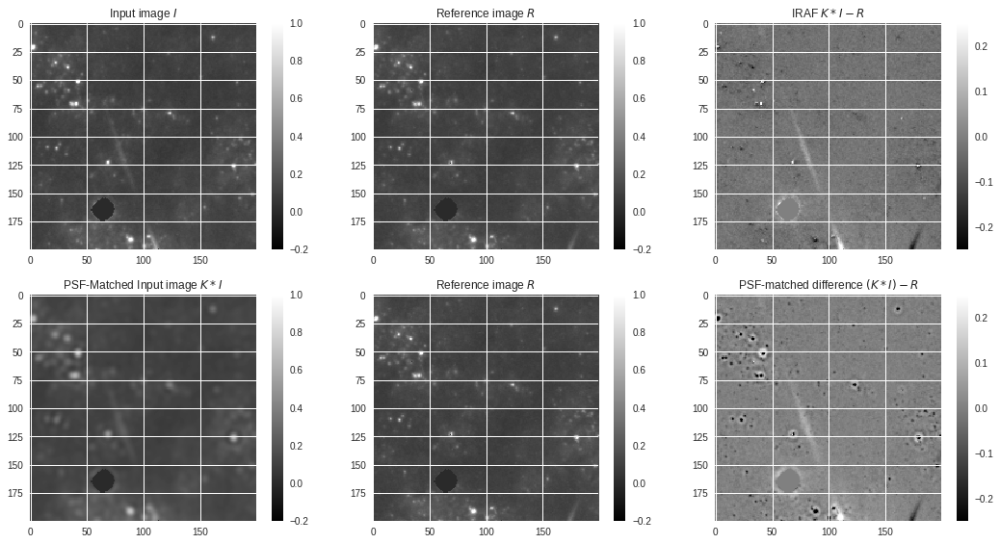

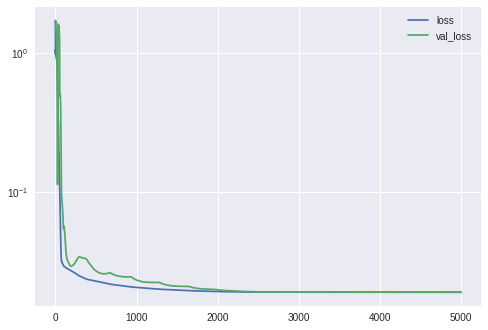

In [0]:
model=psfmatch04(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model4=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model4.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model4,inp,ref,mask,dim)


Epoch 00274: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 00374: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 00656: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 00756: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 00856: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 00956: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01056: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01429: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01665: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01852: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02021: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02121: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02221: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

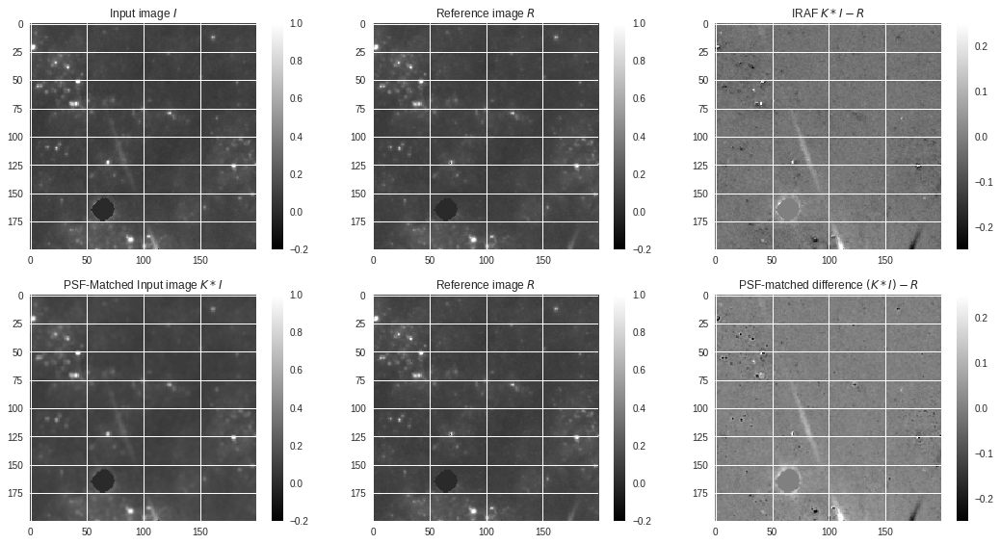

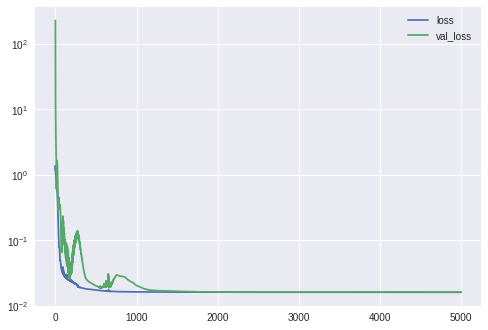

In [0]:
model=psfmatch05(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model5=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model5.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model5,inp,ref,mask,dim)


Epoch 00895: ReduceLROnPlateau reducing learning rate to 0.00562341312621.

Epoch 01137: ReduceLROnPlateau reducing learning rate to 0.00316227765901.

Epoch 01246: ReduceLROnPlateau reducing learning rate to 0.00177827939285.

Epoch 01350: ReduceLROnPlateau reducing learning rate to 0.00100000001188.

Epoch 01450: ReduceLROnPlateau reducing learning rate to 0.0005623413519.

Epoch 01550: ReduceLROnPlateau reducing learning rate to 0.000316227785541.

Epoch 01650: ReduceLROnPlateau reducing learning rate to 0.000177827952378.

Epoch 01750: ReduceLROnPlateau reducing learning rate to 0.000100000007734.

Epoch 01850: ReduceLROnPlateau reducing learning rate to 5.623413519e-05.

Epoch 01950: ReduceLROnPlateau reducing learning rate to 3.16227773266e-05.

Epoch 02050: ReduceLROnPlateau reducing learning rate to 1.77827948286e-05.

Epoch 02150: ReduceLROnPlateau reducing learning rate to 1.00000005689e-05.

Epoch 02250: ReduceLROnPlateau reducing learning rate to 5.62341362129e-06.

Epoch 

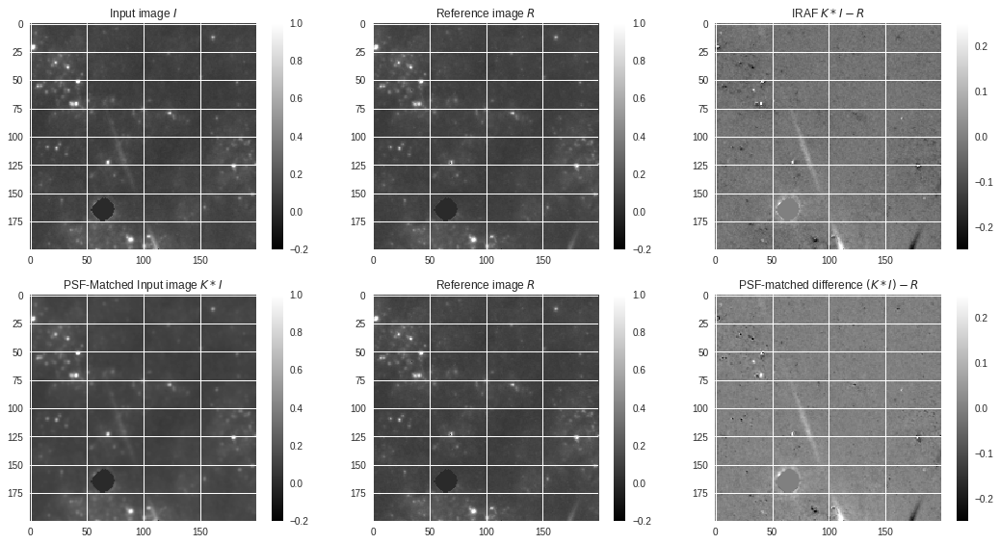

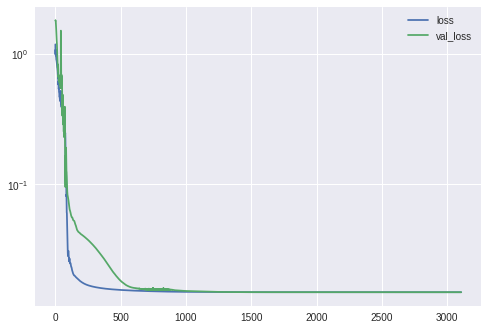

In [0]:
model=psfmatch06(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model6=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model6.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model6,inp,ref,mask,dim)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:112: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "



Epoch 00190: ReduceLROnPlateau reducing learning rate to 0.00562341312621041.

Epoch 00290: ReduceLROnPlateau reducing learning rate to 0.00316227765901377.

Epoch 00390: ReduceLROnPlateau reducing learning rate to 0.0017782793928484836.

Epoch 01363: ReduceLROnPlateau reducing learning rate to 0.0010000000118796527.

Epoch 01592: ReduceLROnPlateau reducing learning rate to 0.0005623413519001288.

Epoch 01704: ReduceLROnPlateau reducing learning rate to 0.0003162277855409209.

Epoch 01817: ReduceLROnPlateau reducing learning rate to 0.00017782795237787763.

Epoch 02007: ReduceLROnPlateau reducing learning rate to 0.0001000000077344799.

Epoch 02107: ReduceLROnPlateau reducing learning rate to 5.623413519001288e-05.

Epoch 02207: ReduceLROnPlateau reducing learning rate to 3.1622777326620596e-05.

Epoch 02307: ReduceLROnPlateau reducing learning rate to 1.7782794828630596e-05.

Epoch 02407: ReduceLROnPlateau reducing learning rate to 1.0000000568869409e-05.

Epoch 02507: ReduceLROnPlat

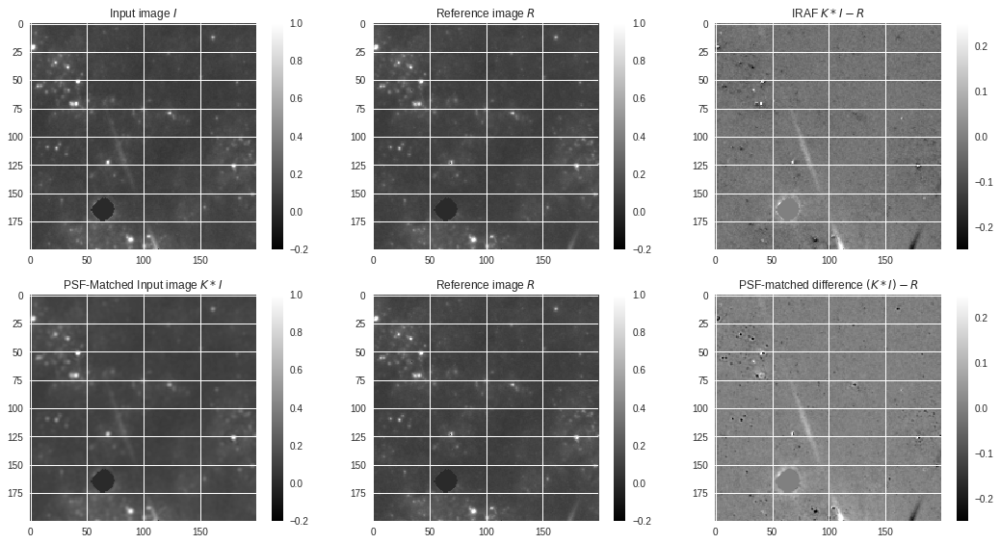

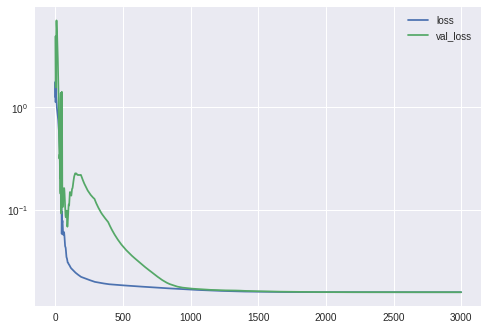

In [0]:
model=psfmatch07(inp.shape,mask=mask,w=17)
model7=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=3000,verbose=False,batch_size=512)
#model7.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model7,inp,ref,mask,dim)

In [0]:
#less layers, relu instead of elu
model=psfmatch05(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model5=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model5.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model5,inp,ref,mask,dim)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:112: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "



Epoch 00405: ReduceLROnPlateau reducing learning rate to 0.00562341312621041.

Epoch 00805: ReduceLROnPlateau reducing learning rate to 0.00316227765901377.

Epoch 01150: ReduceLROnPlateau reducing learning rate to 0.0017782793928484836.

Epoch 01519: ReduceLROnPlateau reducing learning rate to 0.0010000000118796527.

Epoch 01626: ReduceLROnPlateau reducing learning rate to 0.0005623413519001288.

Epoch 01811: ReduceLROnPlateau reducing learning rate to 0.0003162277855409209.

Epoch 01911: ReduceLROnPlateau reducing learning rate to 0.00017782795237787763.

Epoch 02039: ReduceLROnPlateau reducing learning rate to 0.0001000000077344799.

Epoch 02139: ReduceLROnPlateau reducing learning rate to 5.623413519001288e-05.

Epoch 02239: ReduceLROnPlateau reducing learning rate to 3.1622777326620596e-05.

Epoch 02339: ReduceLROnPlateau reducing learning rate to 1.7782794828630596e-05.

Epoch 02439: ReduceLROnPlateau reducing learning rate to 1.0000000568869409e-05.

Epoch 02539: ReduceLROnPlat

AttributeError: ignored

1/1 [==============================] - 1s 668ms/step
MAE:  0.013754982 0.016472036
MAPE: 8.295205980539322 10.162032395601273
SSIM: 0.979451955637121 0.9760460461390378
MAE of iraf_dimage:  0.035273653


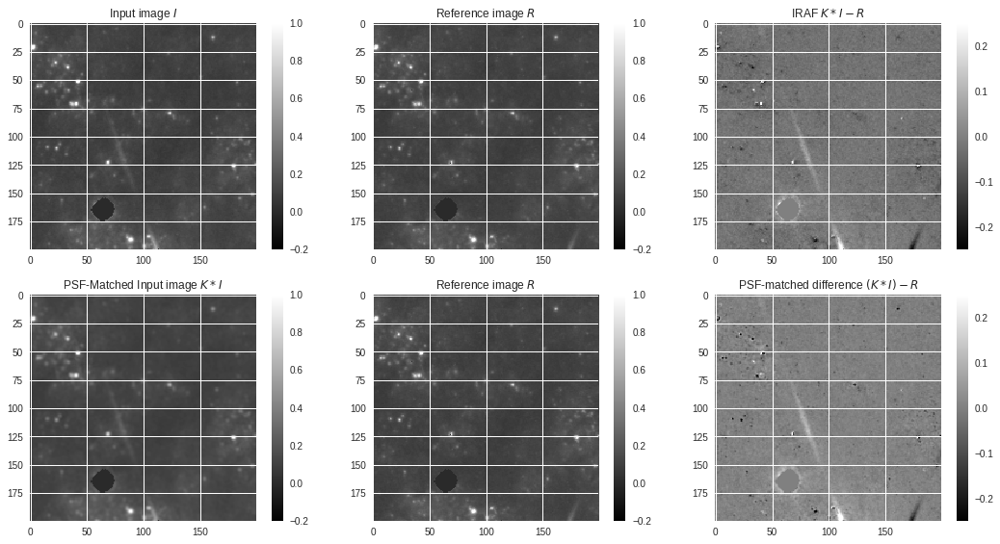

AttributeError: ignored

In [0]:
model5=psfmatch05(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
model5=fitModel(model5,inp[np.newaxis,...],ref[np.newaxis,...],compile_only=True,
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model5.load_weights('/content/gdrive/psf/20190202_1305.hdf5')
model5.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model5,inp,ref,mask,dim)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:112: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "



Epoch 00989: ReduceLROnPlateau reducing learning rate to 0.00562341312621041.

Epoch 01089: ReduceLROnPlateau reducing learning rate to 0.00316227765901377.

Epoch 01189: ReduceLROnPlateau reducing learning rate to 0.0017782793928484836.

Epoch 01289: ReduceLROnPlateau reducing learning rate to 0.0010000000118796527.

Epoch 01475: ReduceLROnPlateau reducing learning rate to 0.0005623413519001288.

Epoch 01575: ReduceLROnPlateau reducing learning rate to 0.0003162277855409209.

Epoch 01675: ReduceLROnPlateau reducing learning rate to 0.00017782795237787763.

Epoch 01775: ReduceLROnPlateau reducing learning rate to 0.0001000000077344799.

Epoch 01895: ReduceLROnPlateau reducing learning rate to 5.623413519001288e-05.

Epoch 01995: ReduceLROnPlateau reducing learning rate to 3.1622777326620596e-05.

Epoch 02095: ReduceLROnPlateau reducing learning rate to 1.7782794828630596e-05.

Epoch 02195: ReduceLROnPlateau reducing learning rate to 1.0000000568869409e-05.

Epoch 02295: ReduceLROnPlat

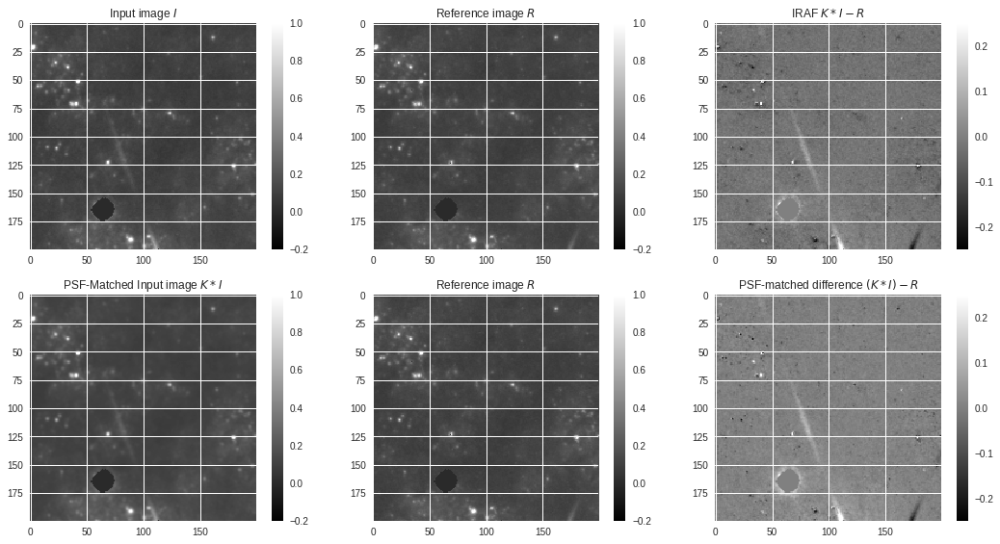

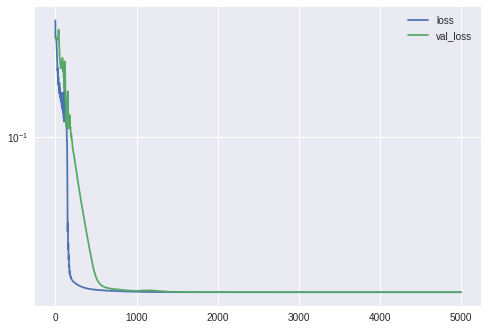

In [0]:
#relu instead of elu
model=psfmatch06(inp.shape,mask=mask)
model6=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=5000,verbose=False,batch_size=512)
model6.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model6,inp,ref,mask,dim)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:112: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "



Epoch 00402: ReduceLROnPlateau reducing learning rate to 0.00562341312621041.

Epoch 00502: ReduceLROnPlateau reducing learning rate to 0.00316227765901377.

Epoch 00602: ReduceLROnPlateau reducing learning rate to 0.0017782793928484836.

Epoch 01034: ReduceLROnPlateau reducing learning rate to 0.0010000000118796527.

Epoch 02221: ReduceLROnPlateau reducing learning rate to 0.0005623413519001288.

Epoch 02409: ReduceLROnPlateau reducing learning rate to 0.0003162277855409209.

Epoch 02538: ReduceLROnPlateau reducing learning rate to 0.00017782795237787763.

Epoch 02664: ReduceLROnPlateau reducing learning rate to 0.0001000000077344799.

Epoch 02764: ReduceLROnPlateau reducing learning rate to 5.623413519001288e-05.

Epoch 02923: ReduceLROnPlateau reducing learning rate to 3.1622777326620596e-05.
Model /content/gdrive/psf/20190202_1826.hdf5 took 1:00:08.448223 to run
1/1 [==============================] - 1s 505ms/step
MAE:  0.01359786 0.016472036
MAPE: 8.063243329524994 10.16203239560

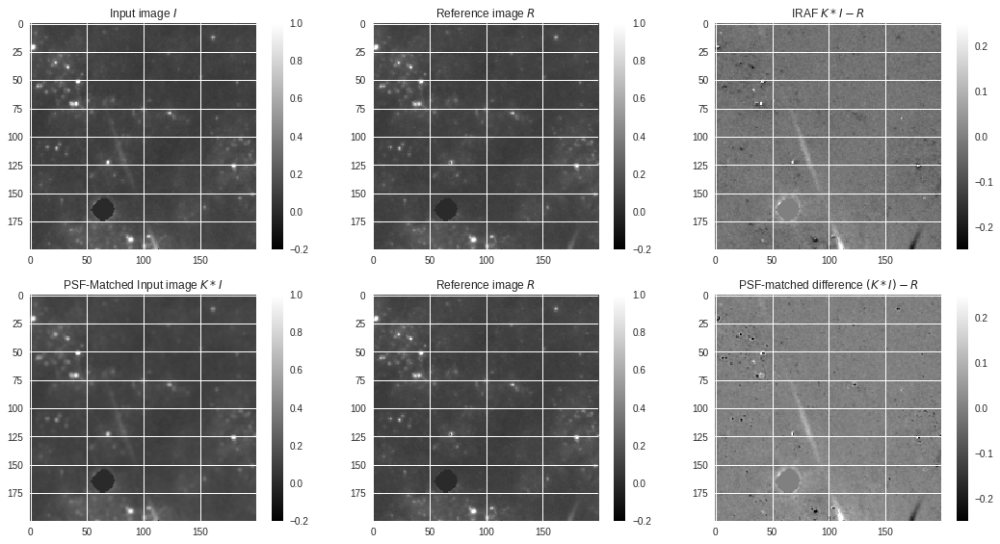

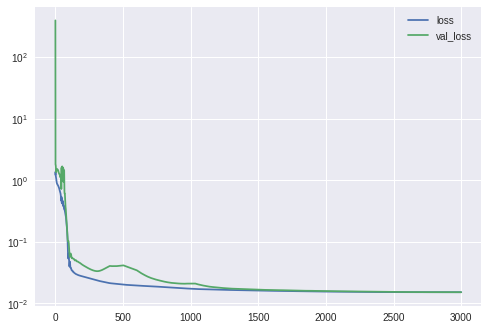

In [0]:
#w=31, 3 steps at 1/3, 2/3, 3/3 and elu
# relu 2:13 0.03314
# elu  2:16 0.03217
model=psfmatch06(inp.shape,mask=mask,w=31,kcube_init=True)
model6=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=3000,verbose=False,batch_size=512,
          stop_patience=500)
model6.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model6,inp,ref,mask,dim)

In [0]:
model=psfmatch(inp.shape,mask=mask,w=21,nsub=1)
model1=fitModel(model,ref[np.newaxis,...],inp[np.newaxis,...],
          lr=0.01,metric='ssim',epochs=3000,verbose=False,batch_size=512)
#model1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
plot(model1,inp,ref,mask,dim,flip=True)

MAE:  0.013271365 0.016472036
MAPE: 8.564863353967667 10.162032395601273
SSIM: 0.9819899931840061 0.9760460461390378
MAE of iraf_dimage:  0.035273653


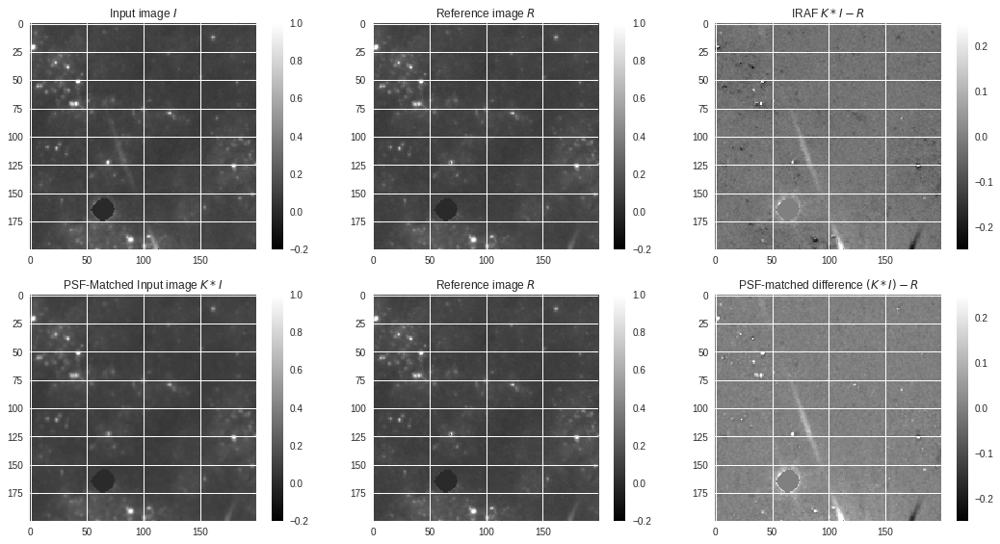

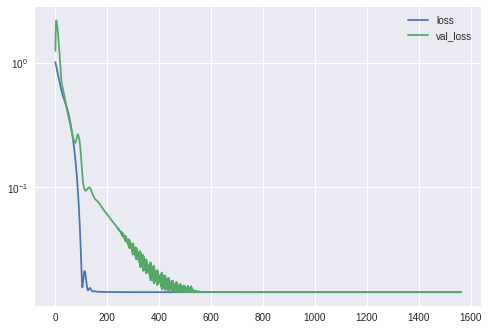

In [0]:
plot(model1,inp,ref,mask,dim,flip=True)

('MAE: ', 0.0066826856, 0.011373735)
('MAPE:', 4.761737212538719, 8.696004748344421)
('SSIM:', 0.9831860119101724, 0.9685789962025017)


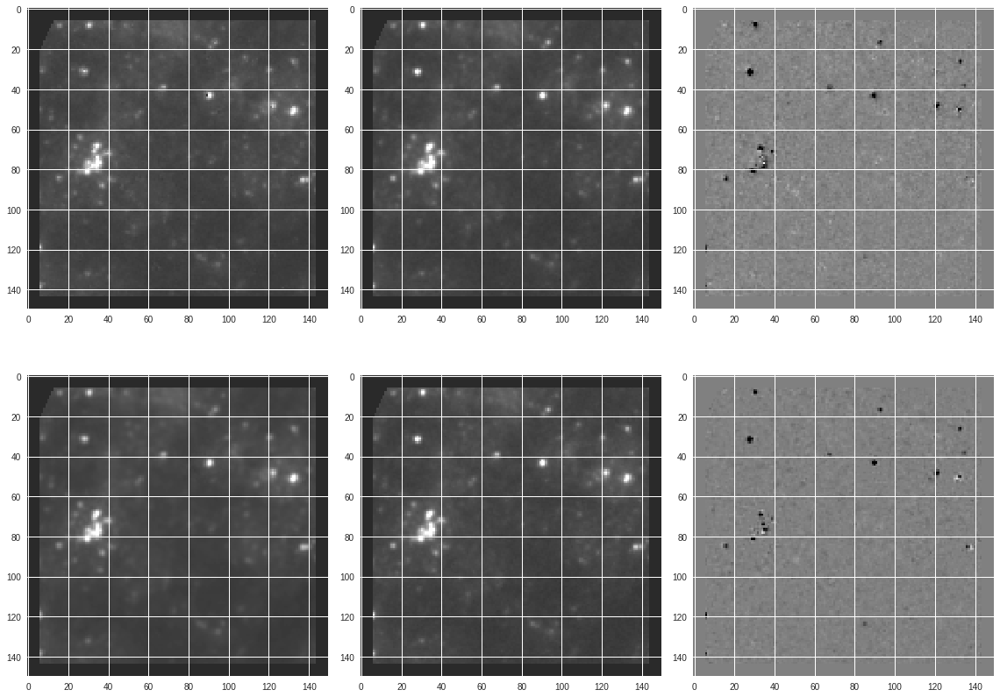

In [0]:
plot(model,inp,ref,mask)

In [0]:
model=psfmatch05(inp.shape,mask=mask)
#print(model.summary())
model5=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=40000,verbose=False,reduce_patience=100,stop_patience=300,
          lr=0.1,decay=10**-0.25,min_lr=1.e-7,)



Epoch 01709: ReduceLROnPlateau reducing learning rate to 0.056234133357.

Epoch 03346: ReduceLROnPlateau reducing learning rate to 0.0316227765901.

Epoch 04857: ReduceLROnPlateau reducing learning rate to 0.0177827931429.

Epoch 07642: ReduceLROnPlateau reducing learning rate to 0.00999999907135.

Epoch 08829: ReduceLROnPlateau reducing learning rate to 0.00562341260249.

Epoch 09920: ReduceLROnPlateau reducing learning rate to 0.00316227739715.

Epoch 12509: ReduceLROnPlateau reducing learning rate to 0.00177827926192.

Epoch 15852: ReduceLROnPlateau reducing learning rate to 0.000999999946415.

Epoch 17696: ReduceLROnPlateau reducing learning rate to 0.000562341286435.

Epoch 18782: ReduceLROnPlateau reducing learning rate to 0.000316227752808.

Epoch 20677: ReduceLROnPlateau reducing learning rate to 0.000177827936012.

Epoch 21543: ReduceLROnPlateau reducing learning rate to 9.99999995513e-05.

Epoch 22261: ReduceLROnPlateau reducing learning rate to 5.62341310984e-05.

Epoch 223

('MAE: ', 0.005455384, 0.011373735)
('MAPE:', 3.929724544286728, 8.696004748344421)
('SSIM:', 0.9863933896085273, 0.9685789962025017)


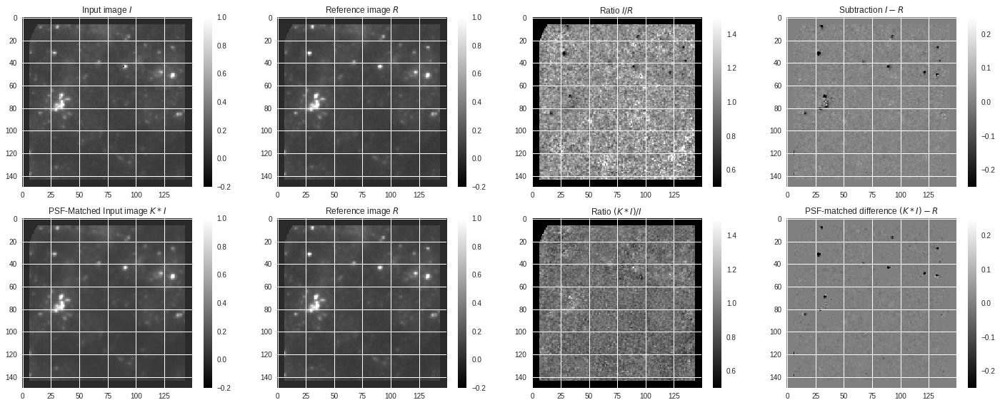

In [0]:
plot(model5,inp,ref,mask)

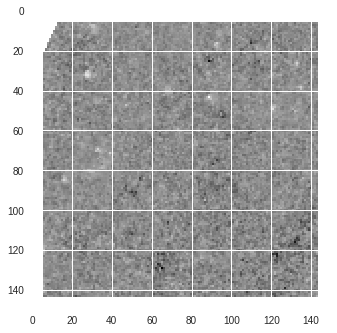

In [0]:
def pplt.imshow(np.clip(mask*np.squeeze(inp/(ref+1.e-6)),-2,2))

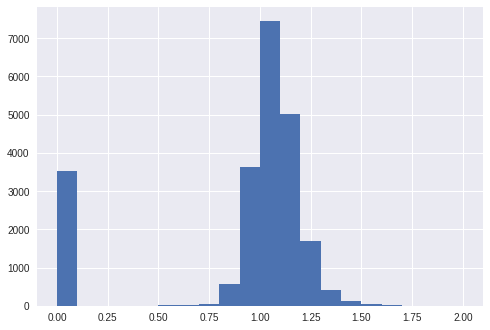

In [0]:
_=plt.hist(np.ravel(np.clip(mask*np.squeeze(inp/(ref+1.e-6)),-2,2)),bins=20)

In [0]:
model6=psfmatch06(inp.shape,mask=mask)
#print(model.summary())
model6=fitModel(model6,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
          metric='mape',epochs=5000,verbose=False,reduce_patience=0,stop_patience=300,
          lr=0.01,decay=1.,min_lr=1.e-7,batch_size=196)
#for l in [64,96,128]:
#  model=fitModel(model,inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis],
#          metric='mape',epochs=10000,verbose=False,reduce_patience=0,stop_patience=300,
#          lr=0.01,decay=10**-0.25,min_lr=1.e-7,warm_start=True,batch_size=l)


mean_squared_error 0.00023824958771001548
loss 4.303353309631348
mean_absolute_error 0.005981806665658951
mean_absolute_percentage_error 4.303353309631348


('MAE: ', 0.038090043, 0.011373735)
('MAPE:', 28.685930371284485, 8.696004748344421)
('SSIM:', 0.8919830887343246, 0.9685789962025017)


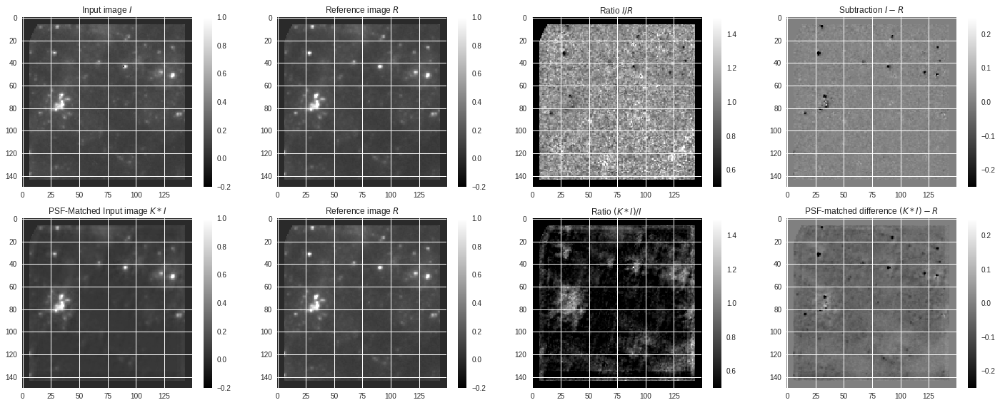

In [0]:
plot(model6,inp,ref,mask)
#model6.evaluate(inp[np.newaxis,...],(mask*np.squeeze(ref+0.))[np.newaxis,...,np.newaxis])

In [0]:
for i,l in enumerate(model.get_weights()):
  print(i,l.shape)

(0, (3, 3, 1, 8))
(1, (8,))
(2, (9, 9, 1, 8))
(3, (8,))
(4, (17, 17, 1, 8))
(5, (8,))
(6, (24,))
(7, (24,))
(8, (24,))
(9, (24,))
(10, (1, 1, 24, 12))
(11, (12,))
(12, (12,))
(13, (12,))
(14, (12,))
(15, (12,))
(16, (15, 15, 12, 1))
(17, (1,))
(18, (1,))
(19, (1,))
(20, (1,))
(21, (1,))


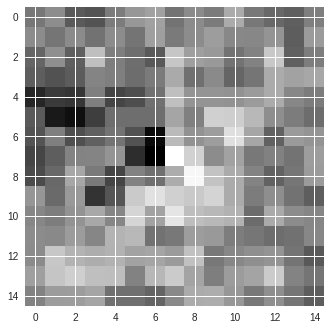

In [0]:
plt.imshow(np.sum(model.get_weights()[16][:,:,:,0],axis=2))

In [0]:
model

NameError: ignored

In [0]:
q.shape

TensorShape([Dimension(None), Dimension(150), Dimension(150), Dimension(1)])

In [0]:
q=K.variable(mask,dtype="bool")
q=K.expand_dims(q,0)
print(q.shape)

(1, 700, 700)


In [0]:
r=K.variable(inp[np.newaxis,...],dtype="float32")
print(r.shape)
#r=K.reshape(r,(-1,?1))

(1, 700, 700, 1)


In [0]:
from tensorflow import boolean_mask
print(q.shape,r.shape)
s=boolean_mask(r,q)

(TensorShape([Dimension(1), Dimension(700), Dimension(700)]), TensorShape([Dimension(1), Dimension(700), Dimension(700), Dimension(1)]))


In [0]:
s=boolean_mask(r,K.variable(mask))

ValueError: ignored

In [0]:
print(np.sum(K.eval(s)),inp.sum())

(11309.65, 11469.286)


In [0]:
print(np.sum(tmp),np.sum(np.squeeze(inp)*mask),np.sum(inp[mask]))

(11309.65, 11309.652, 11309.65)


In [0]:
K.epsilon()

1e-07

In [0]:
m=K.variable(mask[np.newaxis,...,np.newaxis])
masked_pred=boolean_mask(inp[np.newaxis,...,np.newaxis],m)

In [0]:
masked_pred.shape

TensorShape([Dimension(None), Dimension(1)])

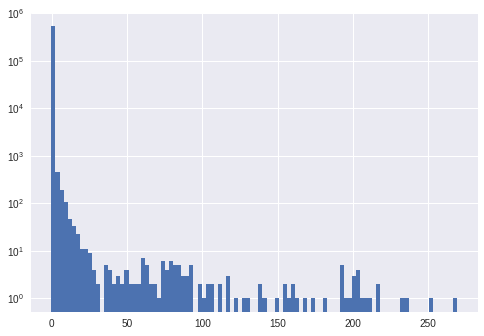

In [0]:
_=plt.hist(np.ravel(inp),bins=100,log=True)

In [0]:
np.percentile(np.ravel(inp),100)

269.4268493652344

In [0]:
import sewar


In [0]:
model1=psfmatch(inp.shape,mask=mask,px=15,kcube_init=True,nsub=1)
model1.load_weights('/content/gdrive/psf/20190130_0350.hdf5')
x1=np.squeeze(model1.predict(inp[np.newaxis,...])).astype(float)*mask
#model6=psfmatch06(inp.shape,mask=mask,px=15,kcube_init=False,nsub=1)
#model6.load_weights('/content/gdrive/psf/20190130_0609.hdf5')
#x6=np.squeeze(model6.predict(inp[np.newaxis,...]))*mask
I=np.squeeze(inp).astype(float)*mask
R=np.squeeze(ref).astype(float)*mask


724 724 7 724 724
section 0 724 0 724


In [0]:
import sewar

ModuleNotFoundError: ignored

In [0]:
print(sewar.full_ref.ergas(R,x1,1),sewar.full_ref.ergas(R,I,1))
print(sewar.full_ref.msssim(R,x1,MAX=np.max(R)),sewar.full_ref.msssim(R,I,MAX=np.max(R)))
print(sewar.full_ref.uqi(R,x1),sewar.full_ref.uqi(R,I))
print(sewar.full_ref.vifp(R,x1),sewar.full_ref.vifp(R,I))
print(sewar.full_ref.scc(R,x1),sewar.full_ref.scc(R,I))


/usr/local/lib/python3.6/dist-packages/sewar/full_ref.py:32: RuntimeWarning: invalid value encountered in sqrt
  rmse_map = np.sqrt(errors)


489.61568502905084 522.8003285783705
0.9939079849261306 0.9932621078101862
0.9926285449089676 0.9909420505893721
0.7518334670064138 0.9758215667404626
0.21327056531770802 0.18036540989652672


In [0]:
import numpy.ma as ma

In [0]:
mR=ma.array(R,mask=~mask)
%time out=snd.uniform_filter(mR,11)

CPU times: user 7.98 ms, sys: 0 ns, total: 7.98 ms
Wall time: 8.42 ms


In [0]:
def foo(X,mask,w):
  ix=X.shape[0]-w
  iy=X.shape[1]-w
  m=~mask
  out=np.zeros((ix*iy,w,w))
  for i in range(ix):
    for j in range(iy):
      out[np.ravel_multi_index([i,j],[ix,iy])]=X[i:i+w,j:j+w]
  return out


In [0]:
%time out=foo(R,mask,11)

CPU times: user 1.53 s, sys: 246 ms, total: 1.77 s
Wall time: 1.78 s


In [0]:
out.shape

(508369, 11, 11)

In [0]:
%time tmp=np.average(out,axis=(2,1))

CPU times: user 73.5 ms, sys: 41 µs, total: 73.5 ms
Wall time: 76.1 ms


In [0]:
%time sewar.full_ref.uqi(R,x1),sewar.full_ref.uqi(R,I)

CPU times: user 99.3 ms, sys: 43.9 ms, total: 143 ms
Wall time: 144 ms


(0.9926285449089676, 0.9909420505893721)

In [0]:
def uqi_single(R,I,ws,mask):
    N = ws**2
    window = np.ones((ws,ws))
    m=skm.binary_erosion(mask,skm.square(4))

    R_bar = snd.uniform_filter(R, ws)    
    I_bar = snd.uniform_filter(I, ws)  
    IR_bar = snd.uniform_filter(I*R,ws)
    
    dR = (R - R_bar)
    dI = (I - I_bar)
    
    R_var = snd.uniform_filter(np.abs(dR),ws)
    I_var = snd.uniform_filter(np.abs(dI),ws)
    IR_var = snd.uniform_filter(dR*dI,ws)
    
    numerator=4*IR_var*IR_bar
    denominator=(np.abs(I_bar)+np.abs(R_bar))*(I_var+R_var)
    m[denominator==0]=0

    q_map = np.ones(denominator.shape)
    index = m
    q_map[index] = numerator[index]/denominator[index]
    q_map=ma.array(q_map,mask=~m)

    s = int(np.round(ws/2))
    return np.mean(q_map[s:-s,s:-s])

In [0]:
print(uqi_single(R,I,11,mask))
print(uqi_single(x1,R,11,mask))

0.9852954396517446
0.990583827068568


In [0]:
print(uqi_single(R,R,8,mask))
print(uqi_single(x1,R,8,mask))

0.008361406072703085
0.005764134017805601


In [0]:
snd.uniform_filter(np.ones((11,11)),11)

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [0]:
#timeing w/o gpu
model=psfmatch(inp.shape,mask=mask,w=15,nsub=1,deepest=False)
model1=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10,verbose=True,batch_size=512)
#model1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
#plot(model1,inp,ref,mask,dim)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_6 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_7 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_8 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 724, 724, 1)       225       
_________________________________________________________________
batch_normalization_2 (Batch (None, 724, 724, 1)       4         
_________________________________________________________________
lambda_9 (Lambda)            (None, 724, 724, 1)       0         
__________

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Train on 1 samples, validate on 1 samples
Epoch 1/10
1/1 [==============================] - 14s 14s/step - loss: 1.0422 - val_loss: 0.6709

Epoch 00001: val_loss improved from inf to 0.67085, saving model to /content/gdrive/psf/20190212_1935.hdf5
Epoch 2/10
1/1 [==============================] - 12s 12s/step - loss: 1.0075 - val_loss: 1.6783

Epoch 00002: val_loss did not improve from 0.67085
Epoch 3/10
1/1 [==============================] - 12s 12s/step - loss: 0.8940 - val_loss: 2.1146

Epoch 00003: val_loss did not improve from 0.67085
Epoch 4/10


KeyboardInterrupt: ignored

In [0]:
#timeing w/ gpu
model=psfmatch(inp.shape,mask=mask,w=15,nsub=1,deepest=False)
model1=fitModel(model,inp[np.newaxis,...],ref[np.newaxis,...],
          metric='ssim',epochs=10,verbose=True,batch_size=512)
#model1.evaluate(inp[np.newaxis,...],ref[np.newaxis,...])
#plot(model1,inp,ref,mask,dim)

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_2 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
lambda_3 (Lambda)            (None, 724, 724, 1)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 724, 724, 1)       225       
_________________________________________________________________
batch_normalization_1 (Batch (None, 724, 724, 1)       4         
_________________________________________________________________
lamb

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Train on 1 samples, validate on 1 samples
Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 1.0431 - val_loss: 0.7227

Epoch 00001: val_loss improved from inf to 0.72270, saving model to /content/gdrive/psf/20190212_1938.hdf5
Epoch 2/10
1/1 [==============================] - 0s 112ms/step - loss: 0.9892 - val_loss: 1.9427

Epoch 00002: val_loss did not improve from 0.72270
Epoch 3/10
1/1 [==============================] - 0s 105ms/step - loss: 1.0620 - val_loss: 0.6433

Epoch 00003: val_loss improved from 0.72270 to 0.64325, saving model to /content/gdrive/psf/20190212_1938.hdf5
Epoch 4/10
1/1 [==============================] - 0s 109ms/step - loss: 0.9415 - val_loss: 1.3432

Epoch 00004: val_loss did not improve from 0.64325
Epoch 5/10
1/1 [==============================] - 0s 109ms/step - loss: 0.9718 - val_loss: 1.8848

Epoch 00005: val_loss did not improve from 0.64325
Epoch 6/10
1/1 [==============================] - 0s 110ms/step - loss: 0.9693 - val_loss: 2.13

In [0]:
ref=np.random.rand(100,100)
inp=ref+0.
inp[48:50,48:50]+=10

In [0]:
1-ssim(inp,ref)

0.00734754270736504

In [0]:
print(np.average(np.abs(inp-ref)),np.average((inp-ref)**2))

0.004 0.04


In [0]:
1-np.sum(inp*ref)/np.sqrt(np.sum(inp**2)*np.sum(ref**2))

0.05503928752628351

In [0]:
img_shape=(101,101,1)
init_image=np.arange(np.prod(img_shape)).reshape(img_shape).astype(np.float32)
X=inp[:202,:201,:]
y=ref[:202,:201,:]
print(X.shape,y.shape)
z0 = L.Input(shape=X.shape)
#x=Image2D()(z0)
x=L.Conv2D(filters=1,kernel_size=1,padding='same',use_bias=False,data_format='channels_last',
           kernel_regularizer=keras.regularizers.l2(0.01))(z0)
model= keras.models.Model(inputs=[z0], outputs=x)
#model.build(img_shape)

opt=keras.optimizers.Adam(lr=0.1)
model.compile(loss=keras_msssim(), optimizer=opt)
print(model.summary())

# transpose my image stack of [n,x,y] to [x,y,n] for channels_last modality
#d=np.transpose(np.array(init_image),(1,2,0))
#print(init_image.shape,d.shape)
history=model.fit([X[np.newaxis,...]],[y[np.newaxis,...]],
                  verbose=1,batch_size=1, epochs=10,) 


(202, 201, 1) (202, 201, 1)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        (None, 202, 201, 1)       0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 202, 201, 1)       1         
Total params: 1
Trainable params: 1
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10
1/1 [==============================] - 8s 8s/step - loss: 0.7763
Epoch 2/10
1/1 [==============================] - 0s 23ms/step - loss: 0.7758
Epoch 3/10
1/1 [==============================] - 0s 14ms/step - loss: 0.7756
Epoch 4/10
1/1 [==============================] - 0s 13ms/step - loss: 0.7756
Epoch 5/10
1/1 [==============================] - 0s 13ms/step - loss: 0.7758
Epoch 6/10
1/1 [==============================] - 0s 14ms/step - loss: 0.7758
Epoch 7/10
1/1 [=============================

In [0]:
inp_mask.shape,d.shape,d.dtype

((724, 724), (101, 101, 1), dtype('float32'))

In [0]:
init_image.dtype

dtype('float32')